# Loading data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

In [3]:
# Load your dataset here
df = pd.read_csv("/content/drive/MyDrive/Datasets/sample_300K_Loan_Data.csv")

df_original = df.copy()

In [4]:
#for fututre use
df = df_original.copy()

In [5]:
# Remove spaces and standardize column names
df.columns = df.columns.str.strip()

In [6]:
df.head(2)

,BranchCode,LoaneeCode,BirthDate,Education Level,Gender,FamilyMember,MaritalStatus,Home Type,Samity Type,Occupation,...,Installment Amount,Demand No,Demand Amount,Collection No,Collection Amount,Outstanding (P+I),Total Interest,DueAmount,Classification,DPD
0,70,1,1973-01-01,Pre-Primary,Female,4.0,Married,Tin Shade,Group,House Wife,...,1500,22,33180.0,22,33180,34500.0,7680.0,0.0,Regular,0
1,1412,2,1999-01-10,Pre-Primary,Female,4.0,Married,Tin Shade,Group,House Wife,...,1000,20,20120.0,20,20120,25000.0,5120.0,0.0,Regular,0


In [7]:
df.shape

(300000, 28)

In [8]:
df.info()      # See data types and non-null counts

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 28 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   BranchCode               300000 non-null  int64  
 1   LoaneeCode               300000 non-null  int64  
 2   BirthDate                300000 non-null  object 
 3   Education Level          300000 non-null  object 
 4   Gender                   300000 non-null  object 
 5   FamilyMember             299219 non-null  float64
 6   MaritalStatus            299966 non-null  object 
 7   Home Type                300000 non-null  object 
 8   Samity Type              300000 non-null  object 
 9   Occupation               300000 non-null  object 
 10  TotalWealth              277406 non-null  object 
 11  Member Category          300000 non-null  object 
 12  DisburseDate             300000 non-null  object 
 13  Disbursement Amount      300000 non-null  int64  
 14  Loan

# PreProcessing

In [9]:
df.isnull().sum()

,0
BranchCode,0
LoaneeCode,0
BirthDate,0
Education Level,0
Gender,0
FamilyMember,781
MaritalStatus,34
Home Type,0
Samity Type,0
Occupation,0


In [10]:
missing_data = df.isnull().sum()
missing_data = missing_data[missing_data > 0]

for col, count in missing_data.items():
    print(f"{col}: {count} missing values")

FamilyMember: 781 missing values
MaritalStatus: 34 missing values
TotalWealth: 22594 missing values


In [11]:
df['TotalWealth'] = pd.to_numeric(df['TotalWealth'], errors='coerce')

In [12]:
df['TotalWealth'] = df['TotalWealth'].fillna(df['TotalWealth'].median())  ## if totalwealth is randomly missing
# df['TotalWealth'].fillna(0, inplace=True)  # if missing total wealth is 0

# impute missing columns
df['FamilyMember'] = df['FamilyMember'].fillna(df['FamilyMember'].median())
df['MaritalStatus'] = df['MaritalStatus'].fillna(df['MaritalStatus'].mode()[0])

In [13]:
# Drop ID columns
df.drop(['LoaneeCode', 'BranchCode'], axis=1, inplace=True)
'''
# Convert dates
df['BirthDate'] = pd.to_datetime(df['BirthDate'])
df['DisburseDate'] = pd.to_datetime(df['DisburseDate'])
df['Age'] = (pd.to_datetime('today') - df['BirthDate']).dt.days // 365
df['LoanAge'] = (pd.to_datetime('today') - df['DisburseDate']).dt.days // 30
'''
df['BirthDate'] = pd.to_datetime(df['BirthDate'], errors='coerce')
df['DisburseDate'] = pd.to_datetime(df['DisburseDate'], errors='coerce')
df['BirthYear'] = df['BirthDate'].dt.year
df['DisbursementYear'] = df['DisburseDate'].dt.year
# Drop raw date columns
df=df.drop(['BirthDate', 'DisburseDate'], axis=1)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 26 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Education Level          300000 non-null  object 
 1   Gender                   300000 non-null  object 
 2   FamilyMember             300000 non-null  float64
 3   MaritalStatus            300000 non-null  object 
 4   Home Type                300000 non-null  object 
 5   Samity Type              300000 non-null  object 
 6   Occupation               300000 non-null  object 
 7   TotalWealth              300000 non-null  float64
 8   Member Category          300000 non-null  object 
 9   Disbursement Amount      300000 non-null  int64  
 10  Loan Product             300000 non-null  object 
 11  Loan Duration in Months  300000 non-null  int64  
 12  LoanTerm                 300000 non-null  int64  
 13  Payment Frequency        300000 non-null  object 
 14  Inst

In [15]:
df.describe()     # statistical data about the columns

,FamilyMember,TotalWealth,Disbursement Amount,Loan Duration in Months,LoanTerm,Installment Amount,Demand No,Demand Amount,Collection No,Collection Amount,Outstanding (P+I),Total Interest,DueAmount,DPD,BirthYear,DisbursementYear
count,300000.000000,3.000000e+05,3.000000e+05,300000.000000,300000.000000,300000.000000,300000.000000,3.000000e+05,300000.000000,3.000000e+05,3.000000e+05,3.000000e+05,3.000000e+05,300000.000000,300000.00000,300000.000000
mean,4.104660,1.433368e+11,8.911076e+04,14.039150,2.037353,7240.848457,13.523833,4.670889e+04,11.934447,4.209315e+04,6.341604e+04,1.638344e+04,4.857170e+03,40.985640,1984.98731,2024.329717
std,2.397654,7.850690e+13,7.850836e+04,4.942935,1.734851,10918.201871,13.026498,6.475822e+04,11.594765,5.611752e+04,7.058520e+04,2.104969e+04,2.480524e+04,139.142068,9.16278,0.681551
min,0.000000,0.000000e+00,1.000000e+03,1.000000,1.000000,25.000000,-24.000000,-3.161680e+05,0.000000,0.000000e+00,1.000000e+00,1.000000e+02,0.000000e+00,0.000000,1940.00000,2016.000000
25%,3.000000,3.500000e+05,5.000000e+04,12.000000,1.000000,1250.000000,4.000000,1.006000e+04,3.000000,8.900000e+03,2.241200e+04,6.030000e+03,0.000000e+00,0.000000,1979.00000,2024.000000
50%,4.000000,6.500000e+05,6.000000e+04,12.000000,1.000000,3840.000000,9.000000,2.880000e+04,8.000000,2.634000e+04,4.375000e+04,8.960000e+03,0.000000e+00,0.000000,1985.00000,2024.000000
75%,5.000000,1.100000e+06,1.000000e+05,12.000000,2.000000,9600.000000,21.000000,5.780000e+04,18.000000,5.376000e+04,7.911125e+04,2.010000e+04,0.000000e+00,0.000000,1991.00000,2025.000000
max,100.000000,4.300000e+16,2.500000e+06,36.000000,28.000000,192000.000000,179.000000,3.680000e+06,130.000000,1.944000e+06,2.823180e+06,1.080000e+06,2.923180e+06,2935.000000,2021.00000,2025.000000


In [16]:
df.columns

Index(['Education Level', 'Gender', 'FamilyMember', 'MaritalStatus',
       'Home Type', 'Samity Type', 'Occupation', 'TotalWealth',
       'Member Category', 'Disbursement Amount', 'Loan Product',
       'Loan Duration in Months', 'LoanTerm', 'Payment Frequency',
       'Installment Amount', 'Demand No', 'Demand Amount', 'Collection No',
       'Collection Amount', 'Outstanding (P+I)', 'Total Interest', 'DueAmount',
       'Classification', 'DPD', 'BirthYear', 'DisbursementYear'],
      dtype='object')

# EDA (Numerical Data)

In [17]:
df = df[df['Classification'] != 'Due']

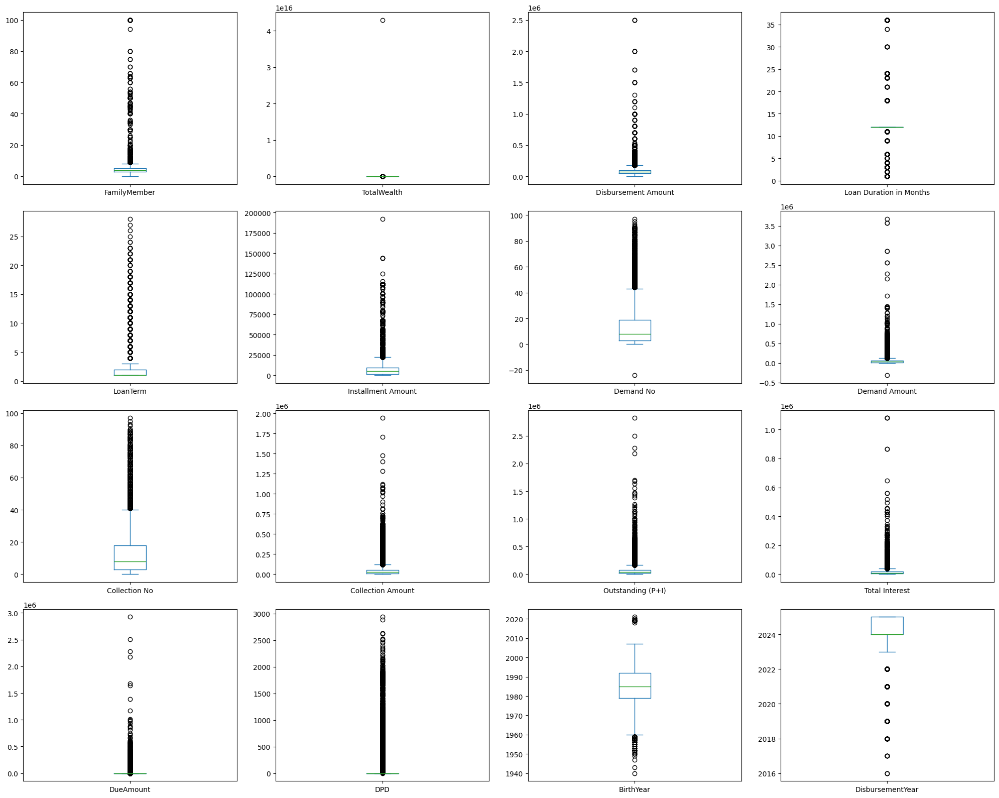

In [18]:
import matplotlib.pyplot as plt
import numpy as np

num_cols = df.select_dtypes(include='number').columns.tolist()
n_plots = len(num_cols)

# Compute number of rows and columns automatically
n_cols = 4
n_rows = int(np.ceil(n_plots / n_cols))

df[num_cols].plot(kind='box', subplots=True, layout=(n_rows, n_cols), figsize=(5*n_cols, 4*n_rows), sharex=False)

plt.tight_layout()
plt.show()

In [19]:
df = df[(df['Demand Amount'] >= 0) & (df['Demand No'] >= 0)]

In [20]:
# Define target
df['target'] = df['Classification'].map({'Regular': 0, 'Overdue': 1})

# Drop rows where target is missing
df = df.dropna(subset=['target'])

/tmp/ipython-input-3978891305.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target'] = df['Classification'].map({'Regular': 0, 'Overdue': 1})


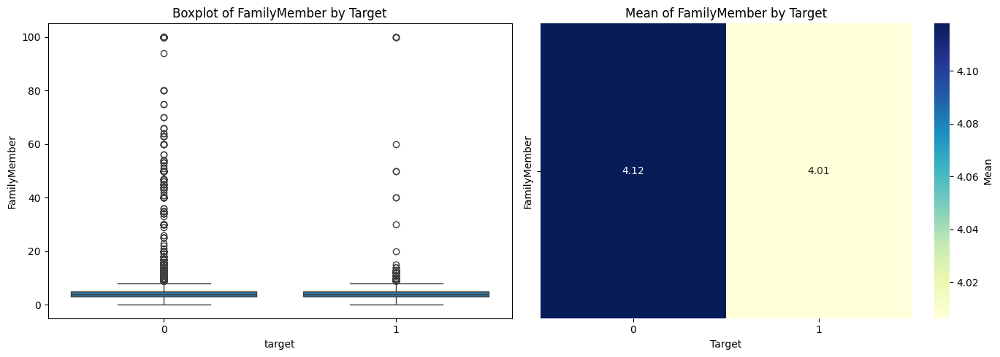

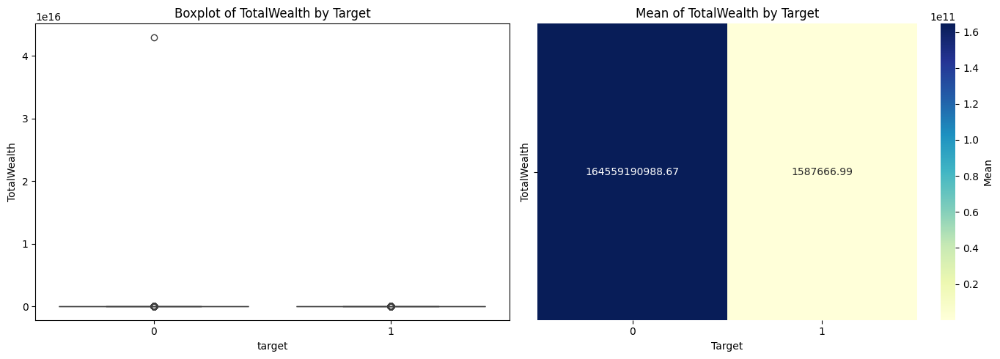

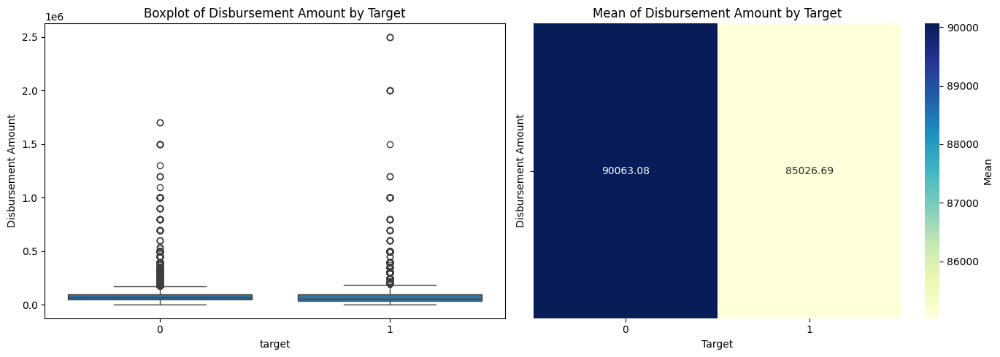

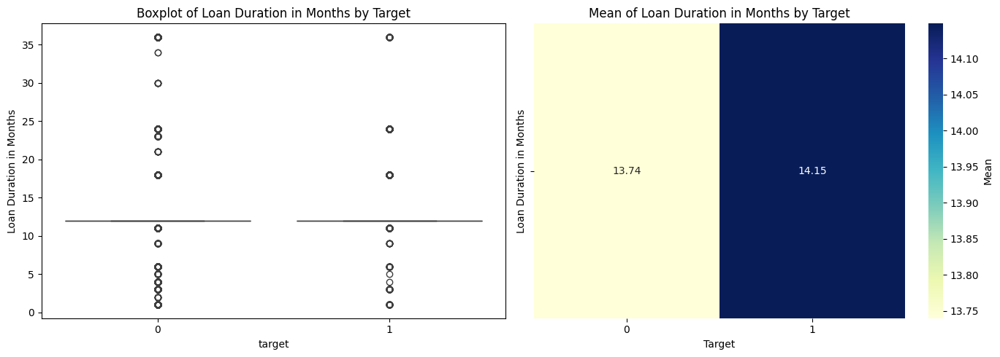

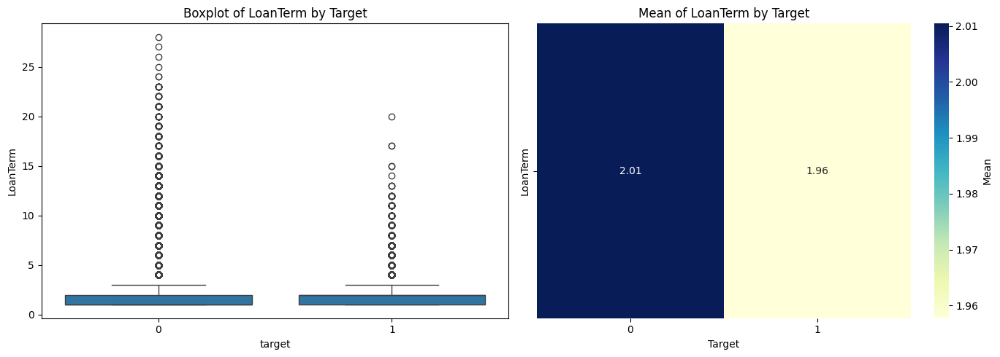

...

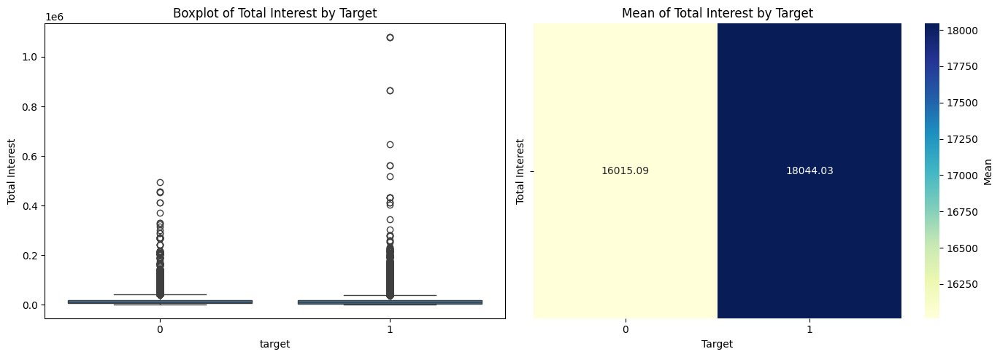

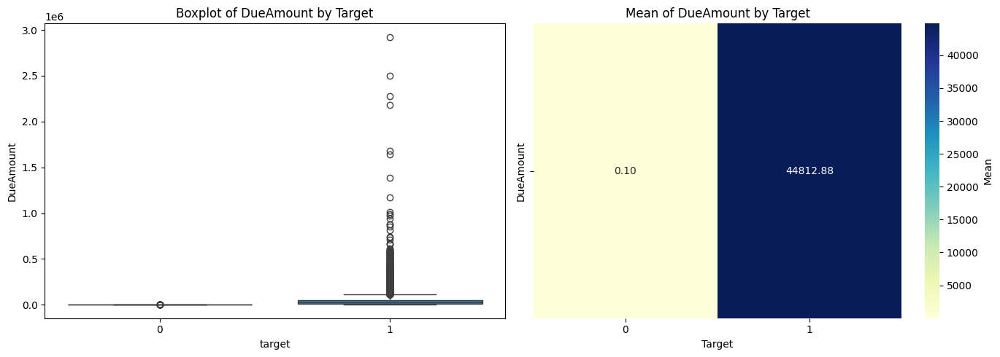

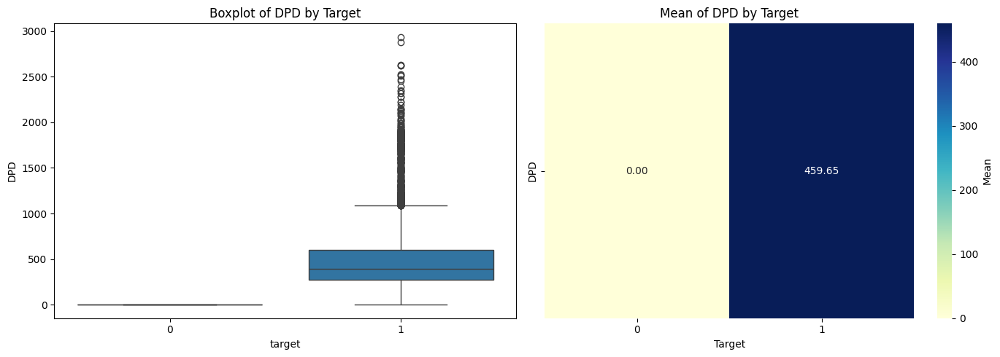

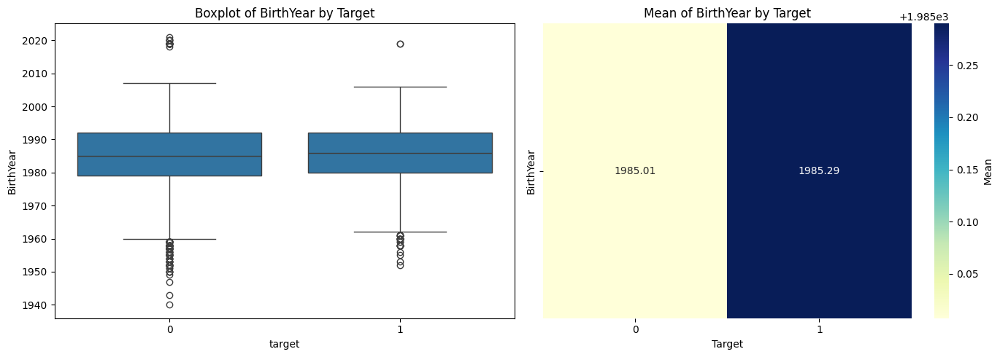

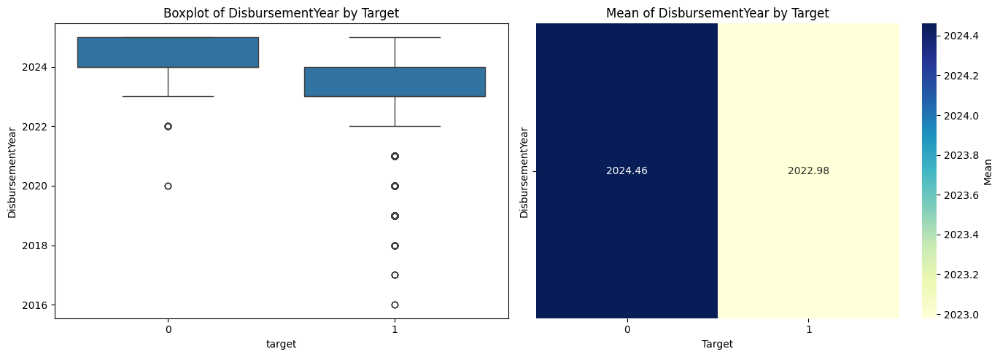

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns
numerical_cols = df.select_dtypes(include='number').drop(columns=['target'], errors='ignore').columns

for col in numerical_cols:
    # Group-wise mean values for heatmap
    mean_df = df.groupby('target')[col].mean().to_frame().T  # make it horizontal for heatmap

    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # 1. Boxplot
    sns.boxplot(data=df, x='target', y=col, ax=axes[0])
    axes[0].set_title(f"Boxplot of {col} by Target")

    # 2. Heatmap of means
    sns.heatmap(mean_df, annot=True, fmt=".2f", cmap="YlGnBu", ax=axes[1], cbar_kws={'label': 'Mean'})
    axes[1].set_title(f"Mean of {col} by Target")
    axes[1].set_ylabel("")  # Remove label for better look
    axes[1].set_xlabel("Target")

    plt.tight_layout()
    plt.show()

In [22]:
leakage_cols = [
    'DPD',
    'DueAmount',
    'Collection No',
    'Collection Amount',
    'Demand No',
    'Demand Amount',
    'Outstanding (P+I)']

df = df.drop(columns=leakage_cols, errors='ignore')

In [23]:
def winsorize_series(series, k=1.5):
    q1 = series.quantile(0.01)
    q3 = series.quantile(0.99)
    iqr = q3 - q1
    lower = q1 - k * iqr
    upper = q3 + k * iqr
    return series.clip(lower, upper)

'''
columns_to_winsorize = [
    'TotalWealth', 'Disbursement Amount', 'Installment Amount',
    'Outstanding (P+I)', 'Total Interest', 'DueAmount',
    'Collection Amount', 'DPD', 'Demand Amount'
]
'''

columns_to_winsorize = [
    'TotalWealth', 'Disbursement Amount', 'Installment Amount',
     'Total Interest'
]

for col in columns_to_winsorize:
    df[col] = winsorize_series(df[col])

In [24]:
'''
clip_cols = [
    'TotalWealth', 'Disbursement Amount', 'Loan Duration in Months',
    'Installment Amount', 'Demand No', 'Demand Amount', 'Collection No',
    'Collection Amount', 'Outstanding (P+I)', 'Total Interest',
    'DueAmount', 'DPD'
]

for col in clip_cols:
    upper = df[col].quantile(0.99)
    df[col] = df[col].clip(upper=upper)
    '''

df['FamilyMember']=df['FamilyMember'].clip(upper=20)
df['LoanTerm']=df['LoanTerm'].clip(upper=18)

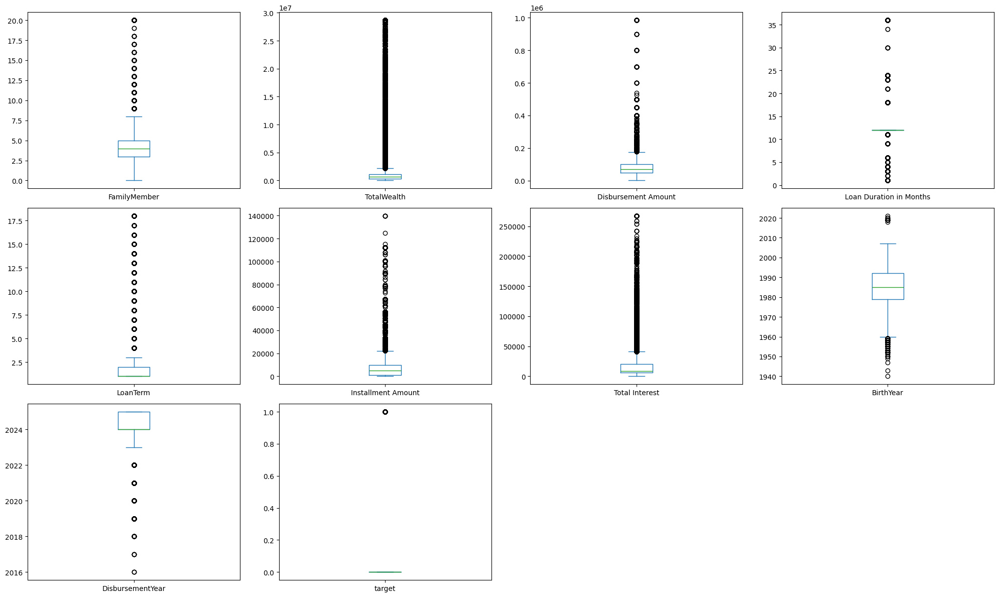

In [25]:
import matplotlib.pyplot as plt
import numpy as np

num_cols = df.select_dtypes(include='number').columns.tolist()
n_plots = len(num_cols)

# Compute number of rows and columns automatically
n_cols = 4
n_rows = int(np.ceil(n_plots / n_cols))

df[num_cols].plot(kind='box', subplots=True, layout=(n_rows, n_cols), figsize=(5*n_cols, 4*n_rows), sharex=False)

plt.tight_layout()
plt.show()

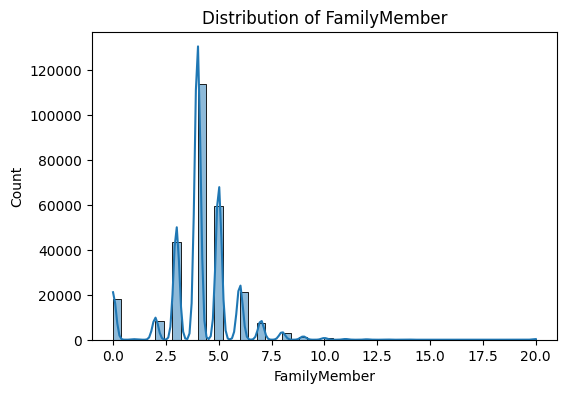

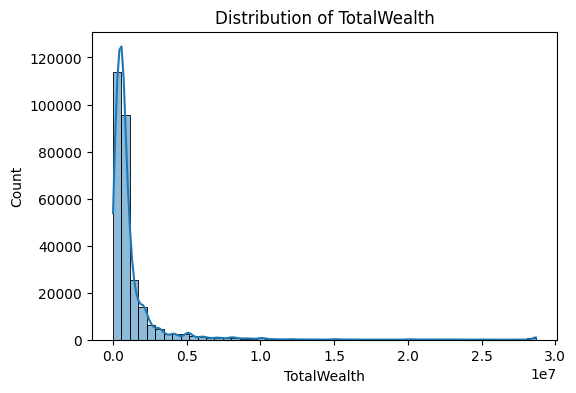

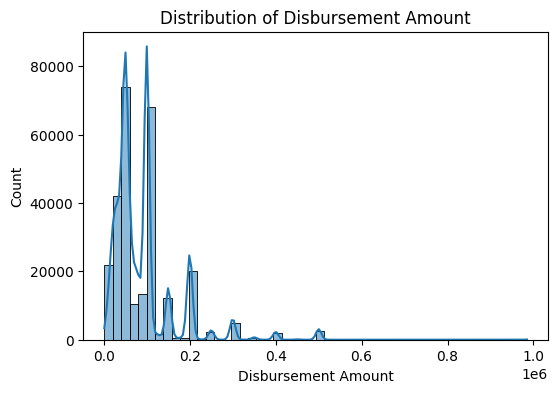

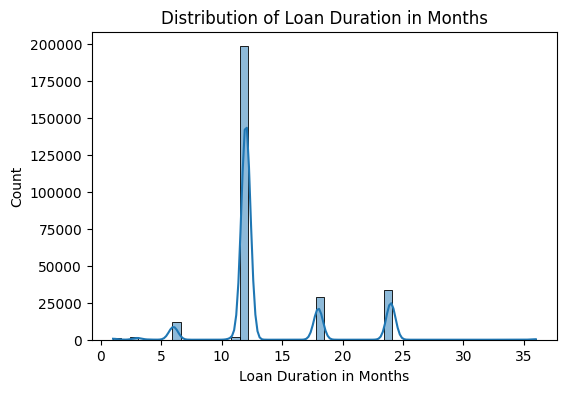

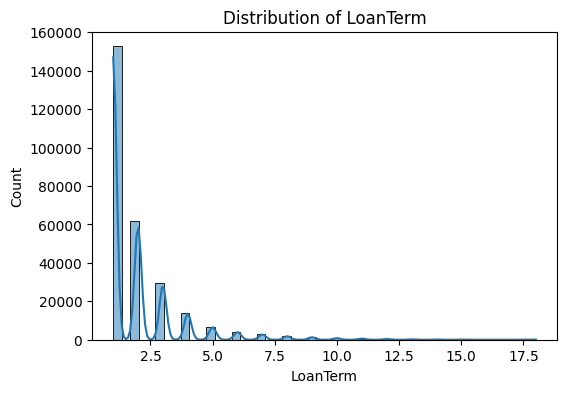

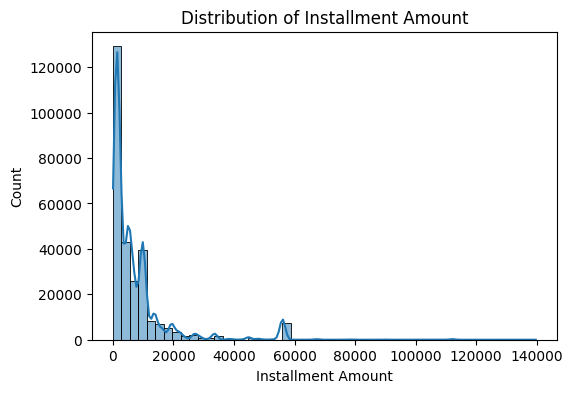

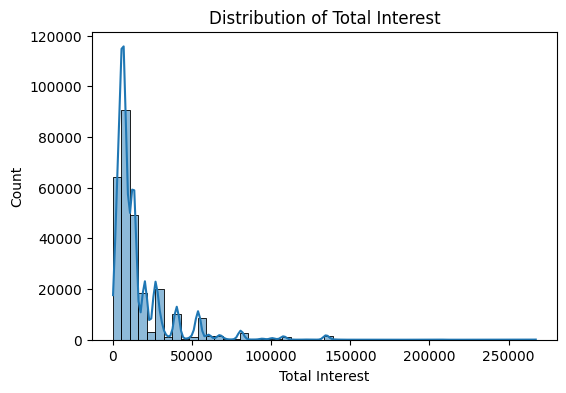

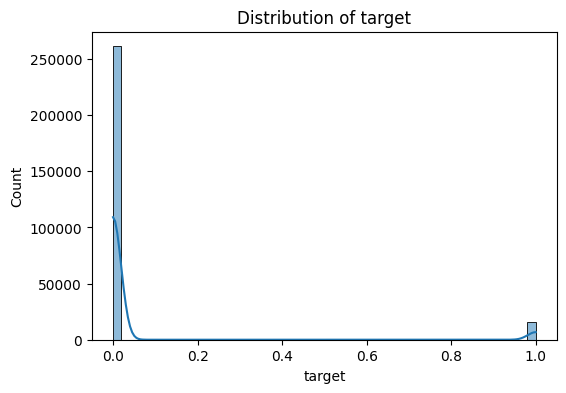

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

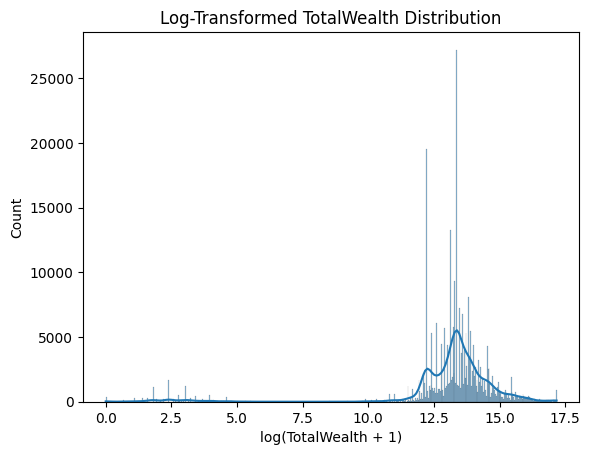

In [27]:
sns.histplot(np.log1p(df['TotalWealth']), kde=True)
plt.title("Log-Transformed TotalWealth Distribution")
plt.xlabel("log(TotalWealth + 1)")
plt.show()

In [28]:
'''

# List of monetary numeric columns to log-transform
money_columns = ['Disbursement Amount', 'TotalWealth', 'Outstanding (P+I)',
    'Installment Amount', 'Demand Amount', 'Collection Amount',
    'Total Interest', 'DueAmount']

# Replace zeroes or negative values temporarily to avoid log errors
# Then apply log1p (i.e., log(1 + x)) to preserve zeroes safely
for col in money_columns:
    # Impute missing values (optional: choose median or mean)
    df[col].fillna(df[col].median(), inplace=True)

    # Apply log1p transform (safe for zero and positive)
    df[col] = np.log1p(df[col])
    '''

"\n\n# List of monetary numeric columns to log-transform\nmoney_columns = ['Disbursement Amount', 'TotalWealth', 'Outstanding (P+I)',\n    'Installment Amount', 'Demand Amount', 'Collection Amount',\n    'Total Interest', 'DueAmount']\n\n# Replace zeroes or negative values temporarily to avoid log errors\n# Then apply log1p (i.e., log(1 + x)) to preserve zeroes safely\nfor col in money_columns:\n    # Impute missing values (optional: choose median or mean)\n    df[col].fillna(df[col].median(), inplace=True)\n    \n    # Apply log1p transform (safe for zero and positive)\n    df[col] = np.log1p(df[col])\n    "

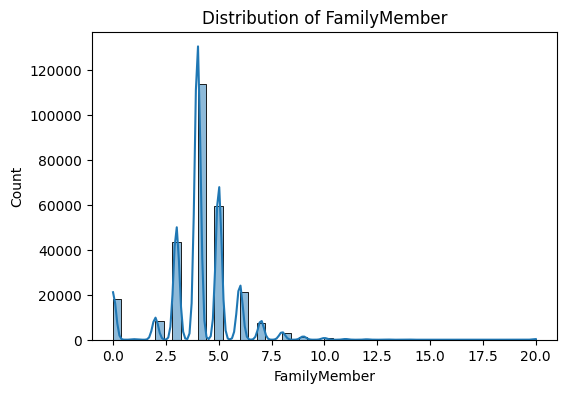

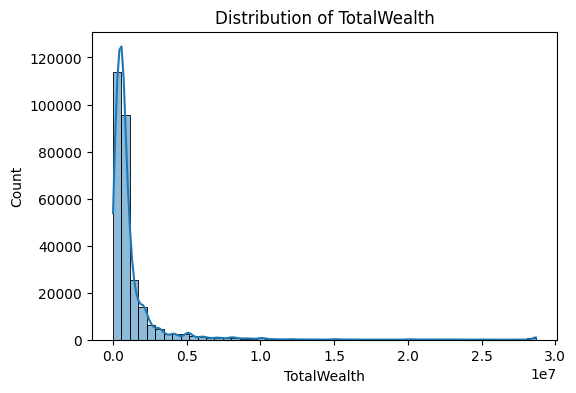

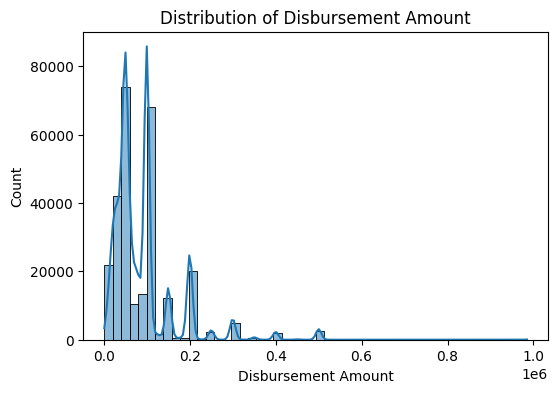

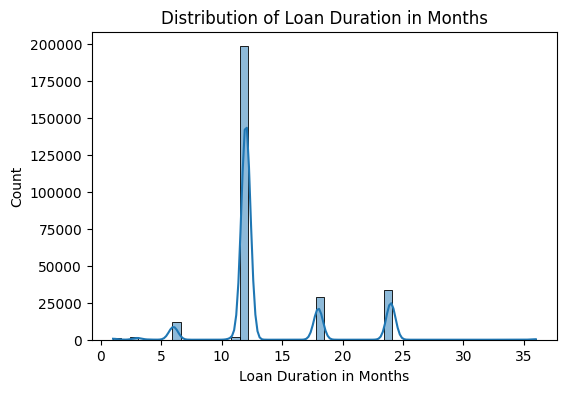

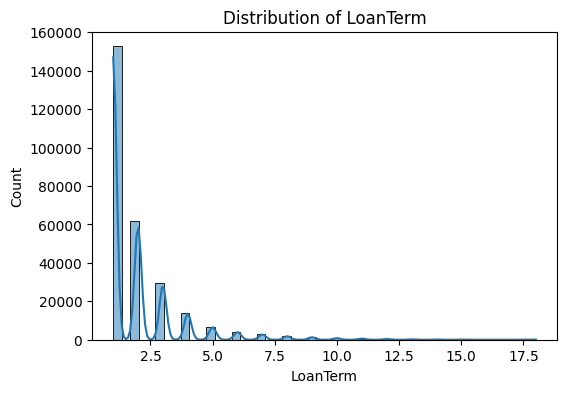

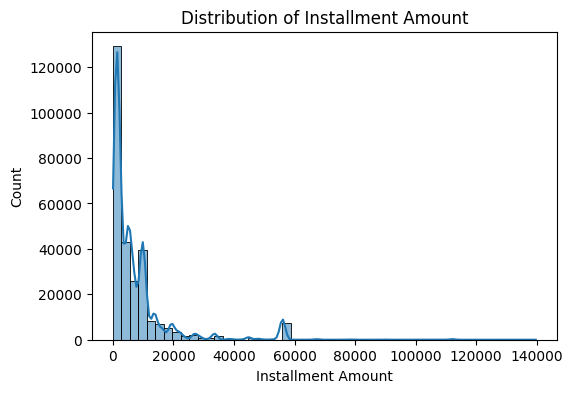

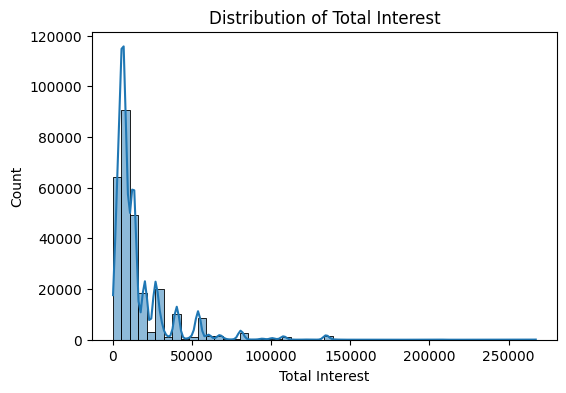

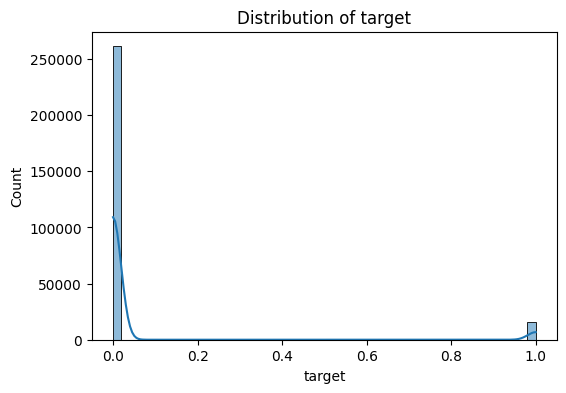

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

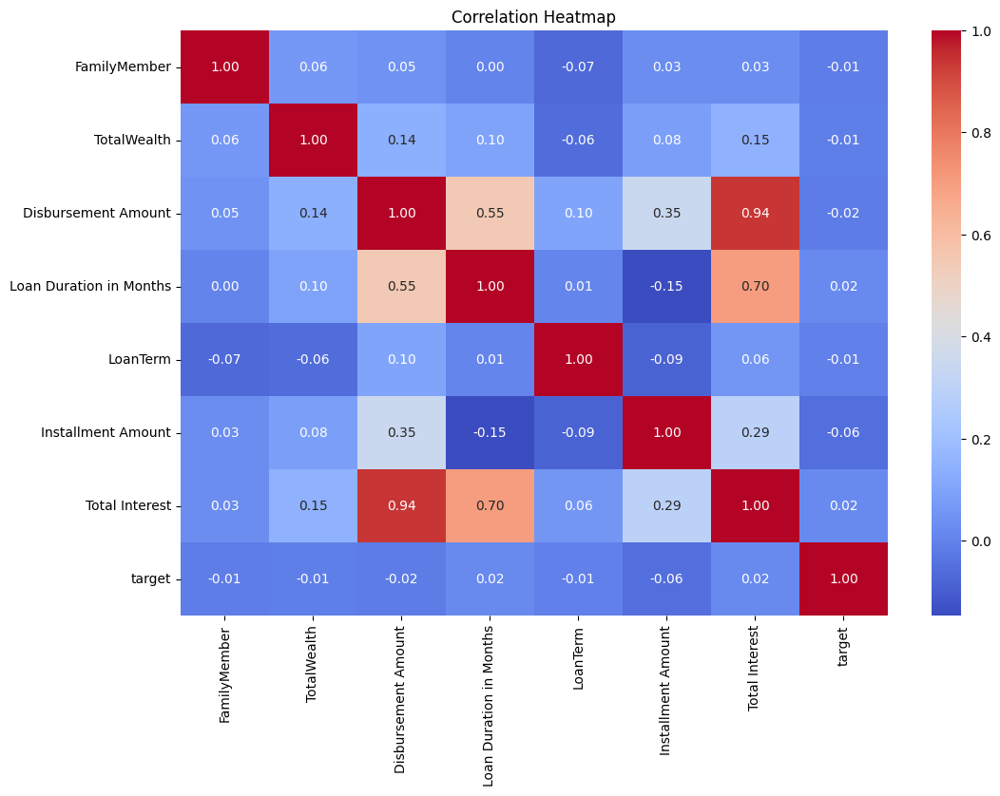

In [30]:
plt.figure(figsize=(12, 8))
sns.heatmap(df[numerical_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

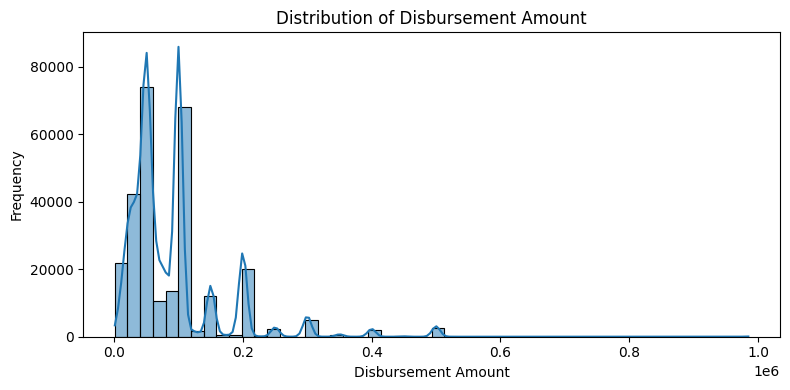

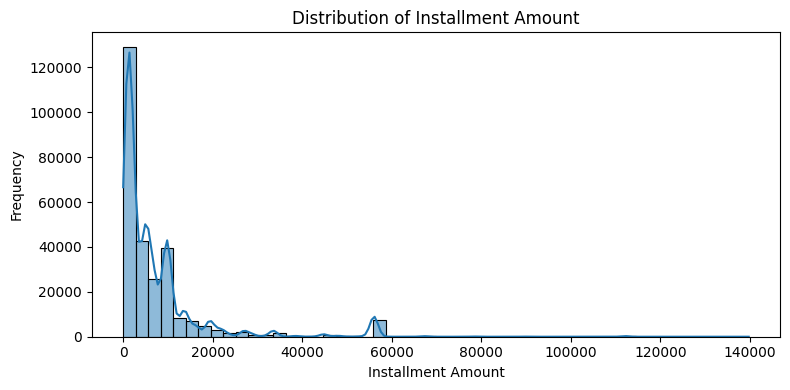

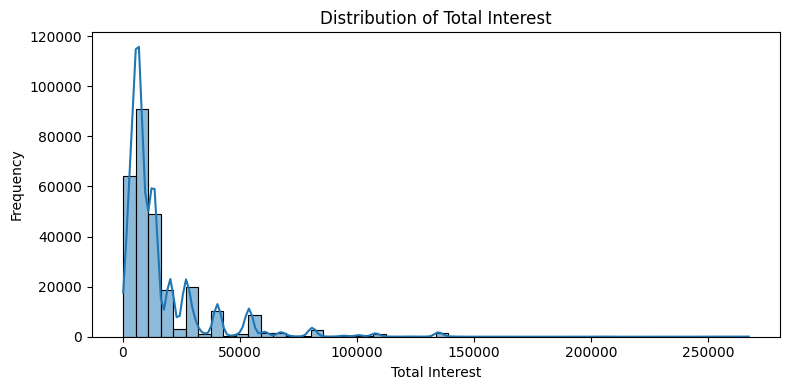

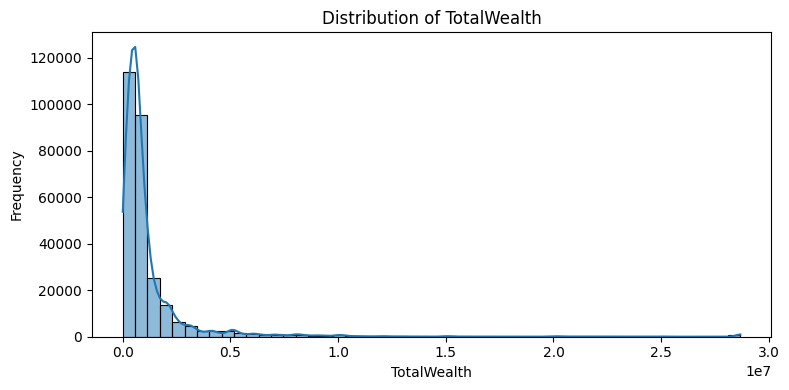

In [31]:
numeric_cols = ['Disbursement Amount', 'Installment Amount', 'Total Interest',  'TotalWealth']

for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(data=df, x=col, bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


In [32]:
max_value = df['TotalWealth'].max()
print("Maximum TotalWealth:", max_value)

Maximum TotalWealth: 28680989.499999765


In [33]:
'''
df['LogTotalWealth'] = np.log1p(df['TotalWealth'])
df.drop(['TotalWealth', 'TotalWealth_clipped'], axis=1, inplace=True)
'''

"\ndf['LogTotalWealth'] = np.log1p(df['TotalWealth'])\ndf.drop(['TotalWealth', 'TotalWealth_clipped'], axis=1, inplace=True)\n"

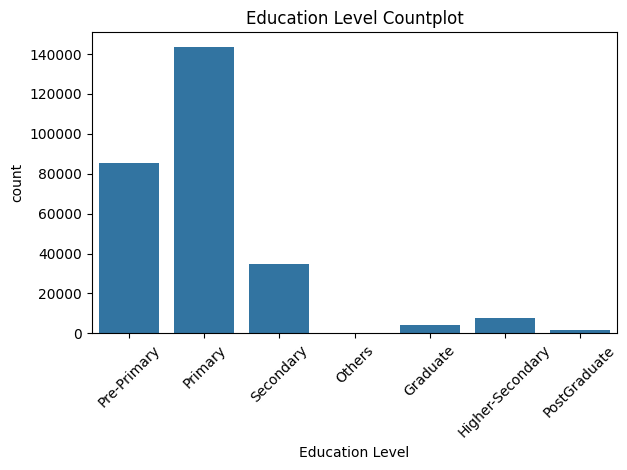

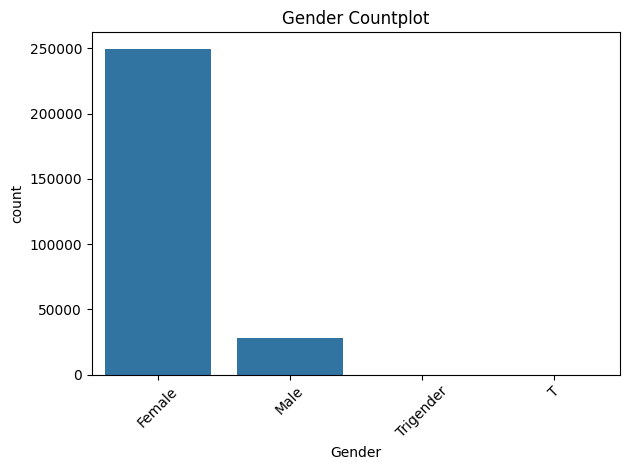

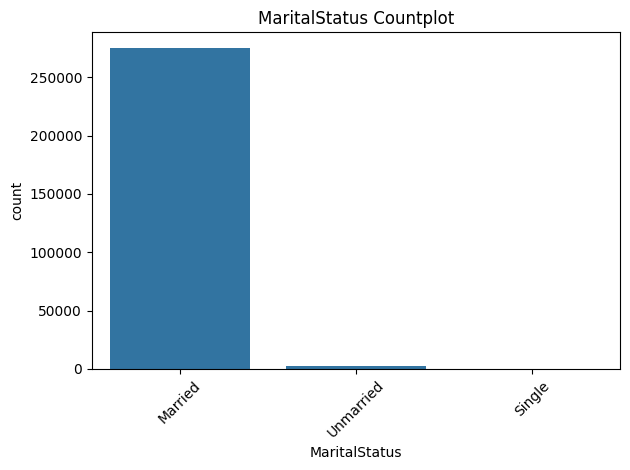

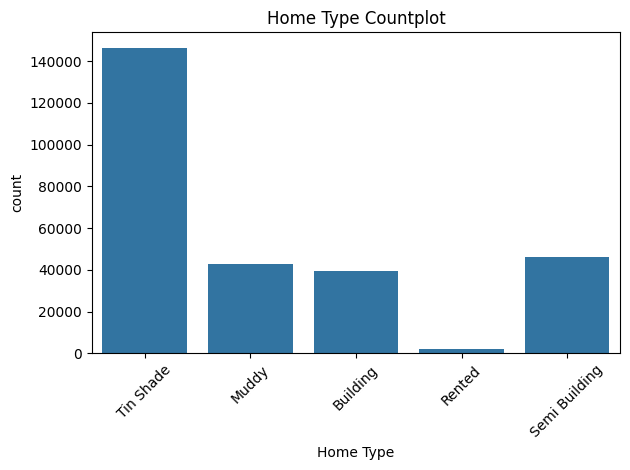

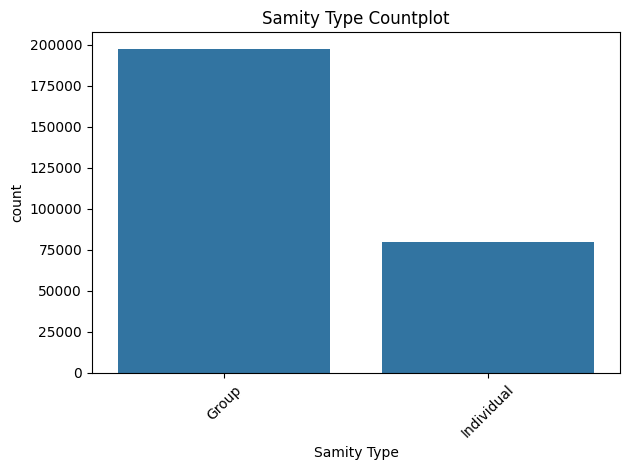

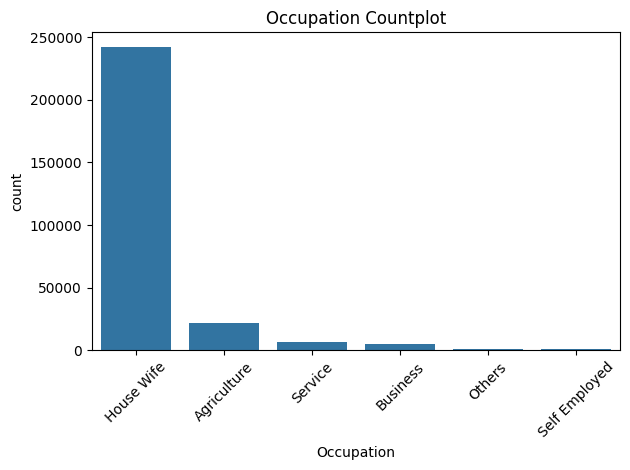

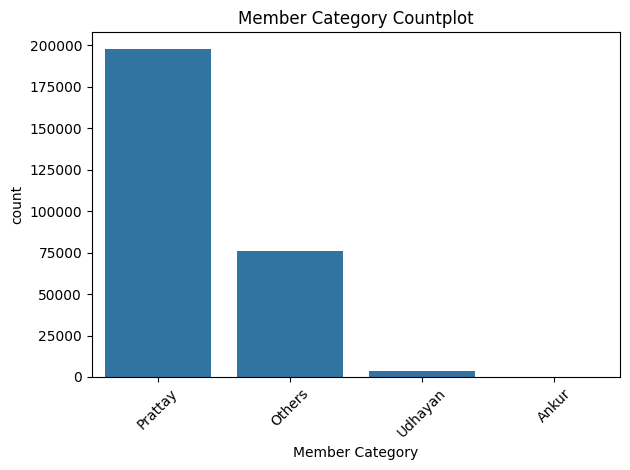

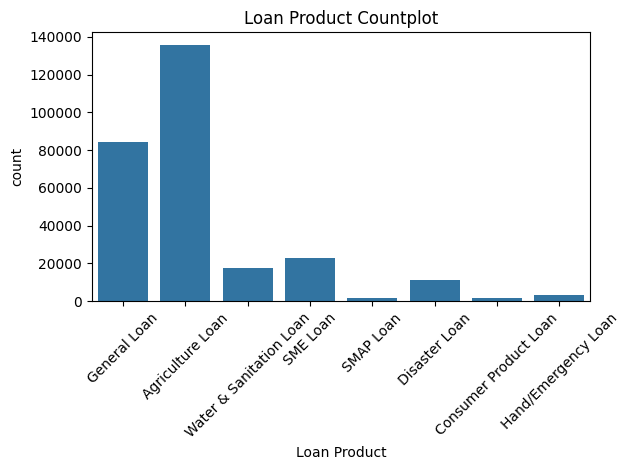

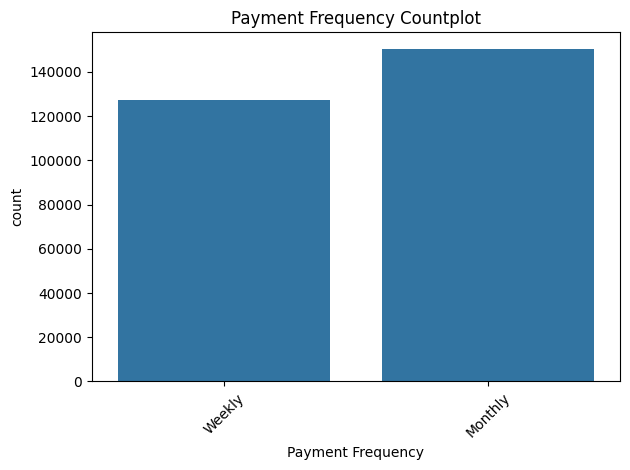

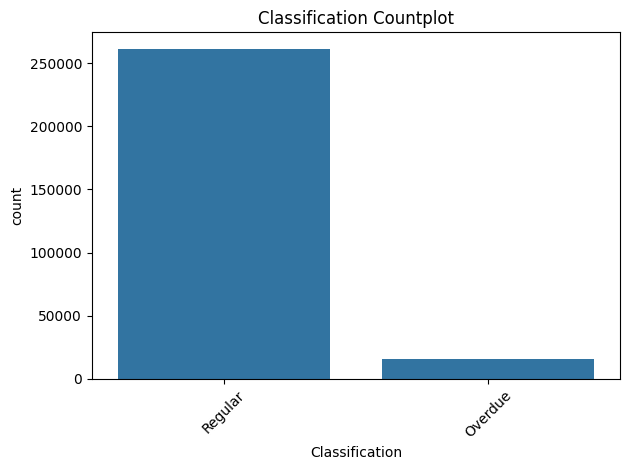

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Categorical columns only
categorical_cols = df.select_dtypes(include='object').columns

# Simple countplots
for col in categorical_cols:
    sns.countplot(x=col, data=df)
    plt.title(f"{col} Countplot")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


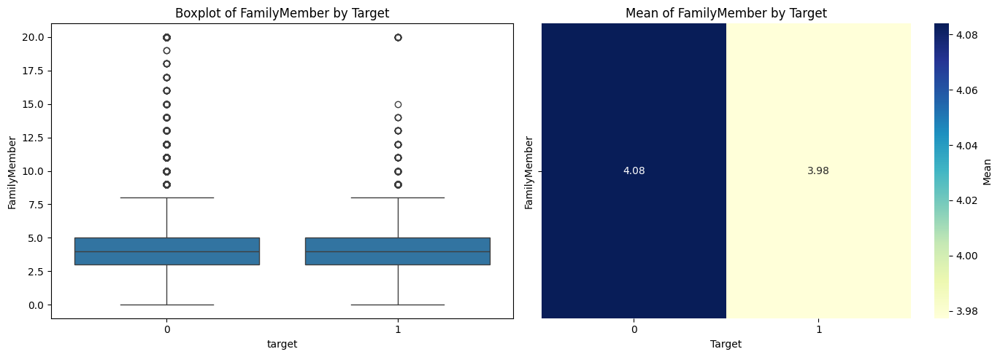

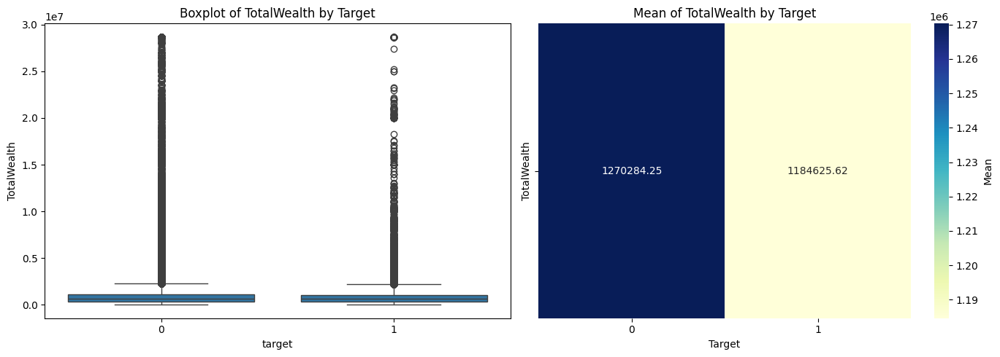

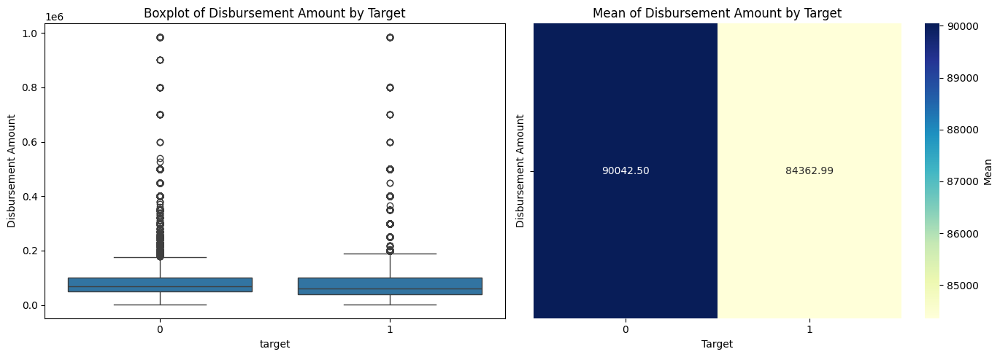

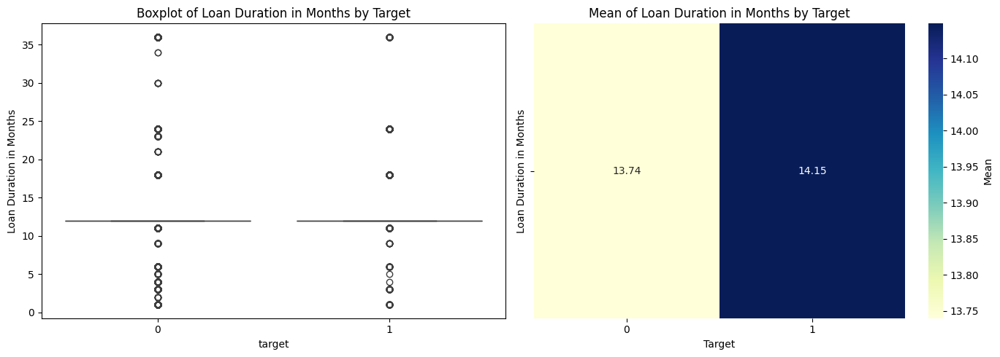

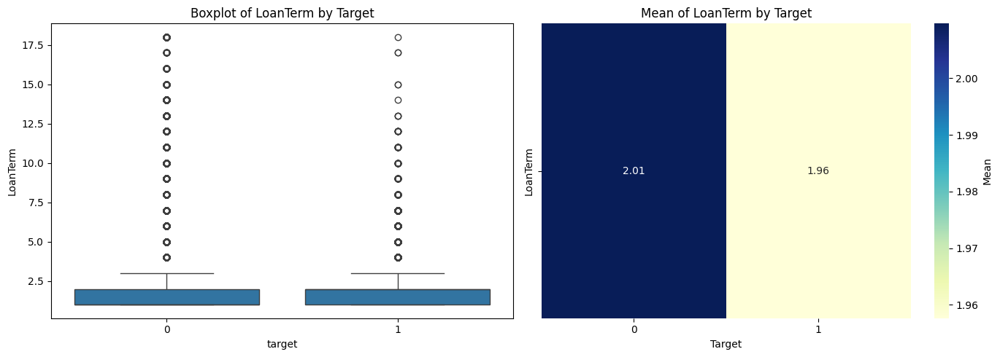

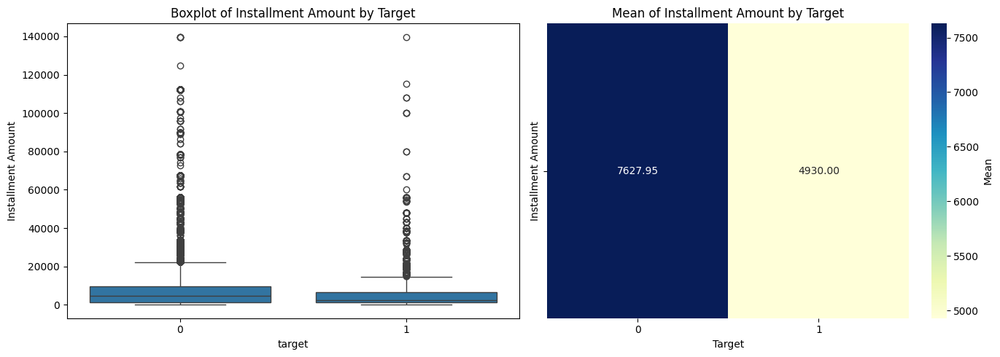

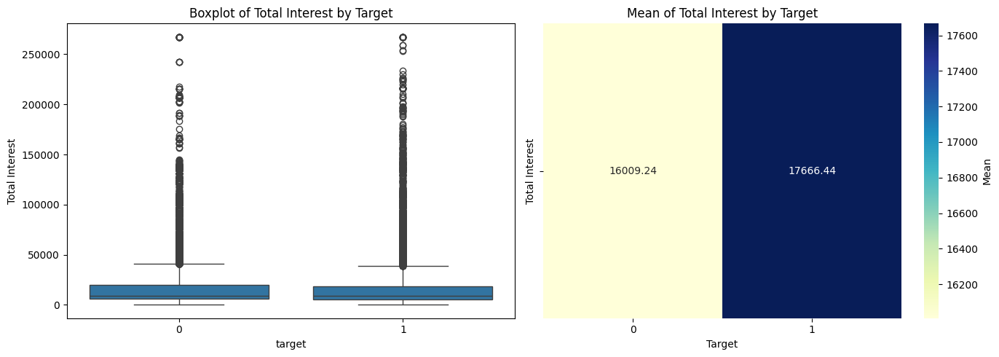

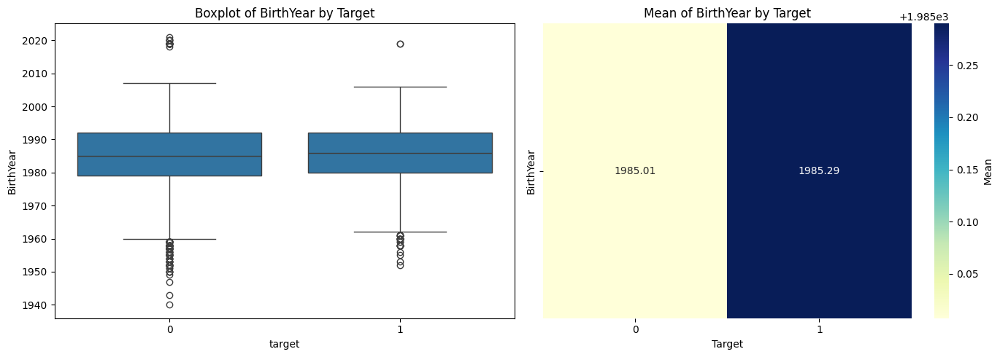

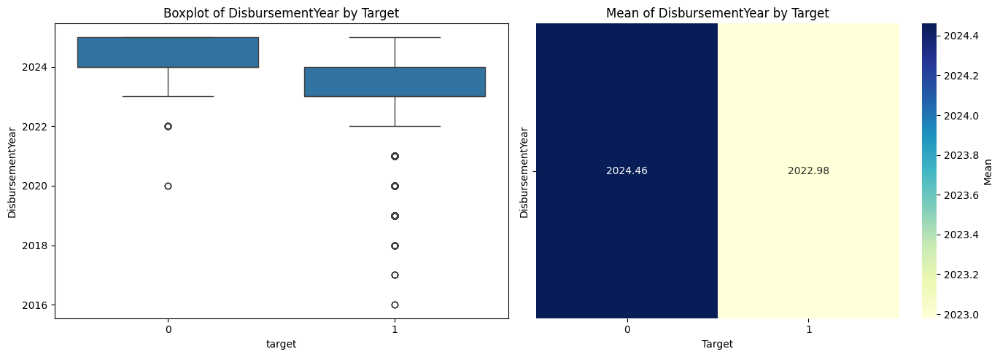

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns
numerical_cols = df.select_dtypes(include='number').drop(columns=['target'], errors='ignore').columns

for col in numerical_cols:
    # Group-wise mean values for heatmap
    mean_df = df.groupby('target')[col].mean().to_frame().T  # make it horizontal for heatmap

    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # 1. Boxplot
    sns.boxplot(data=df, x='target', y=col, ax=axes[0])
    axes[0].set_title(f"Boxplot of {col} by Target")

    # 2. Heatmap of means
    sns.heatmap(mean_df, annot=True, fmt=".2f", cmap="YlGnBu", ax=axes[1], cbar_kws={'label': 'Mean'})
    axes[1].set_title(f"Mean of {col} by Target")
    axes[1].set_ylabel("")  # Remove label for better look
    axes[1].set_xlabel("Target")

    plt.tight_layout()
    plt.show()

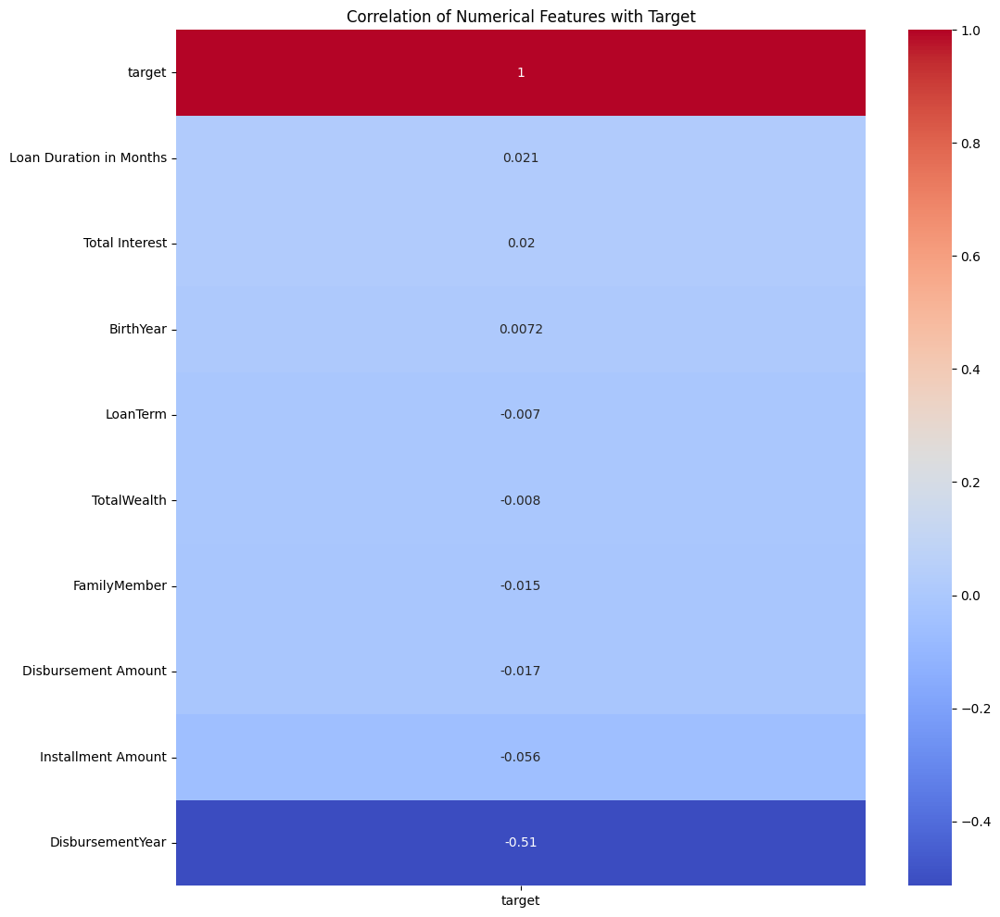

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter numerical columns only
numerical_cols = df.select_dtypes(include=['number']).columns

# Compute correlation matrix for numerical columns
cor_matrix = df[numerical_cols].corr()

# Plot correlation with target only
plt.figure(figsize=(12, 12))
sns.heatmap(cor_matrix[['target']].sort_values(by='target', ascending=False), annot=True, cmap='coolwarm')
plt.title("Correlation of Numerical Features with Target")
plt.show()

In [36]:
df.head()

,Education Level,Gender,FamilyMember,MaritalStatus,Home Type,Samity Type,Occupation,TotalWealth,Member Category,Disbursement Amount,Loan Product,Loan Duration in Months,LoanTerm,Payment Frequency,Installment Amount,Total Interest,Classification,BirthYear,DisbursementYear,target
0,Pre-Primary,Female,4.0,Married,Tin Shade,Group,House Wife,1200000.0,Prattay,60000,General Loan,12,5,Weekly,1500,7680.0,Regular,1973,2024,0
1,Pre-Primary,Female,4.0,Married,Tin Shade,Group,House Wife,1560000.0,Prattay,40000,Agriculture Loan,12,2,Weekly,1000,5120.0,Regular,1999,2024,0
2,Primary,Female,4.0,Married,Tin Shade,Group,House Wife,1350000.0,Prattay,40000,General Loan,12,1,Weekly,1000,5120.0,Regular,1994,2025,0
3,Pre-Primary,Female,5.0,Married,Tin Shade,Group,House Wife,1000000.0,Prattay,70000,Agriculture Loan,12,2,Monthly,6720,9450.0,Regular,1982,2024,0
4,Pre-Primary,Female,0.0,Married,Muddy,Group,House Wife,650000.0,Prattay,40000,Agriculture Loan,12,2,Weekly,1000,5120.0,Regular,1975,2024,0


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 277477 entries, 0 to 299999
Data columns (total 20 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Education Level          277477 non-null  object 
 1   Gender                   277477 non-null  object 
 2   FamilyMember             277477 non-null  float64
 3   MaritalStatus            277477 non-null  object 
 4   Home Type                277477 non-null  object 
 5   Samity Type              277477 non-null  object 
 6   Occupation               277477 non-null  object 
 7   TotalWealth              277477 non-null  float64
 8   Member Category          277477 non-null  object 
 9   Disbursement Amount      277477 non-null  int64  
 10  Loan Product             277477 non-null  object 
 11  Loan Duration in Months  277477 non-null  int64  
 12  LoanTerm                 277477 non-null  int64  
 13  Payment Frequency        277477 non-null  object 
 14  Installme

In [38]:
# Select only categorical columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns

# Print unique values in each categorical column
for col in cat_cols:
    print(f"\n--- {col} ---")
    print(df[col].unique())


--- Education Level ---
['Pre-Primary' 'Primary' 'Secondary' 'Others' 'Graduate'
 'Higher-Secondary' 'PostGraduate']

--- Gender ---
['Female' 'Male' 'Trigender' 'T']

--- MaritalStatus ---
['Married' 'Unmarried' 'Single']

--- Home Type ---
['Tin Shade' 'Muddy' 'Building' 'Rented' 'Semi Building']

--- Samity Type ---
['Group' 'Individual']

--- Occupation ---
['House Wife' 'Agriculture' 'Service' 'Business' 'Others' 'Self Employed']

--- Member Category ---
['Prattay' 'Others' 'Udhayan' 'Ankur']

--- Loan Product ---
['General Loan' 'Agriculture Loan' 'Water & Sanitation Loan' 'SME Loan'
 'SMAP Loan' 'Disaster Loan' 'Consumer Product Loan' 'Hand/Emergency Loan']

--- Payment Frequency ---
['Weekly' 'Monthly']

--- Classification ---
['Regular' 'Overdue']


In [39]:
df['Gender'] = df['Gender'].replace({
    'T': 'Trigender'
})

df['MaritalStatus'] = df['MaritalStatus'].replace({
    'Single': 'Unmarried'
})

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Identify categorical columns
categorical_cols = df.select_dtypes(include='object').columns

# Loop through each categorical column and plot
for col in categorical_cols:
    plt.figure(figsize=(8, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')
    plt.title(f"Countplot of {col}")
    plt.xticks(rotation=45)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


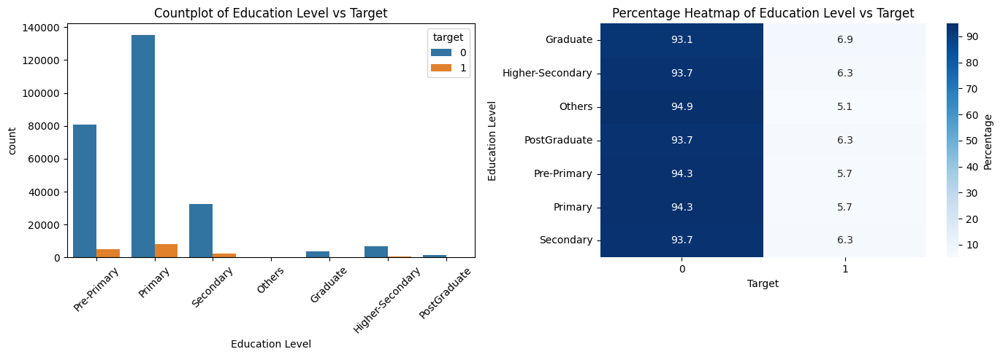

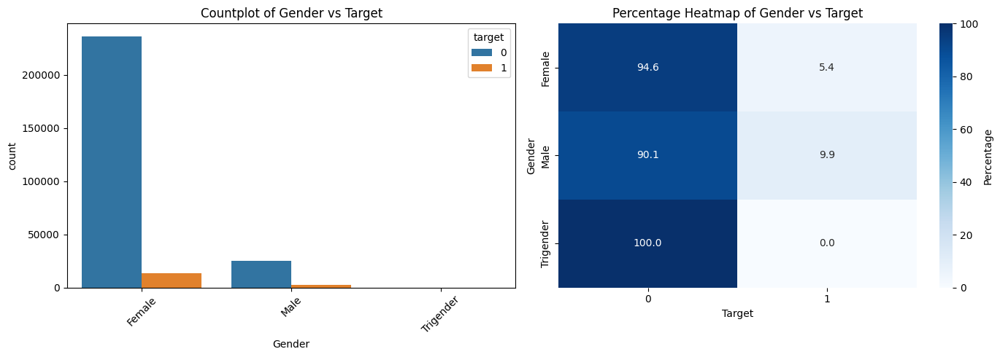

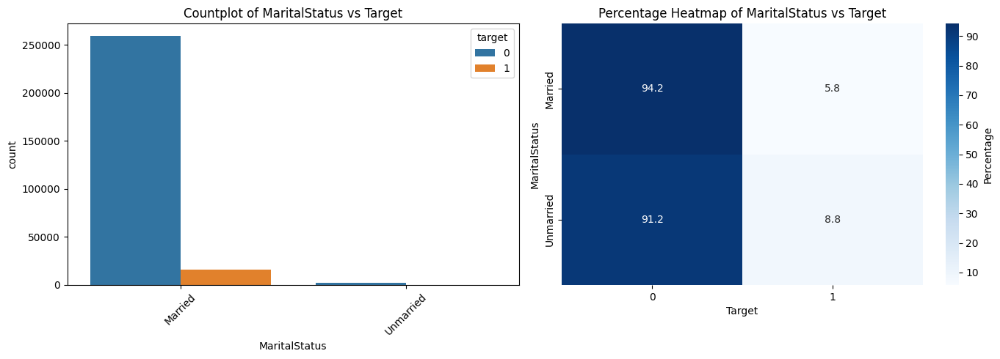

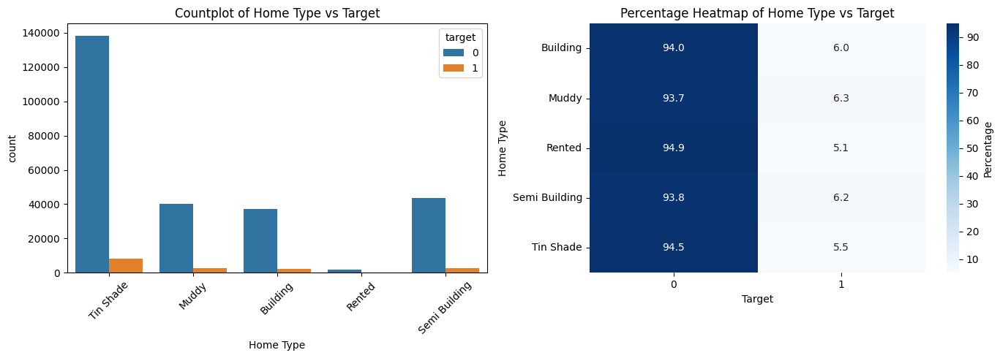

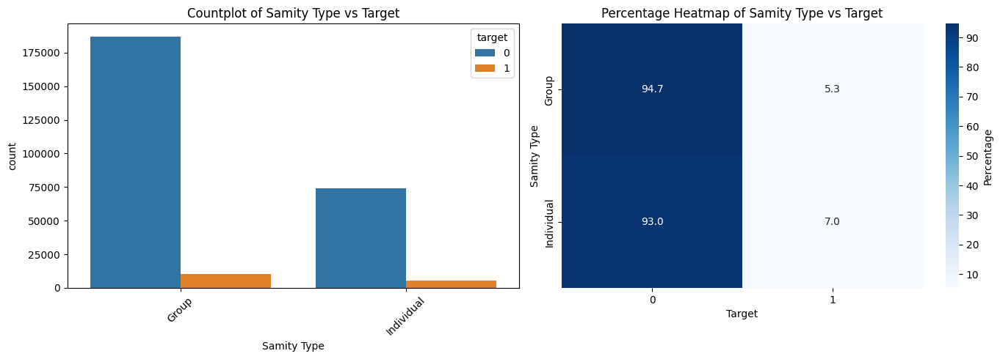

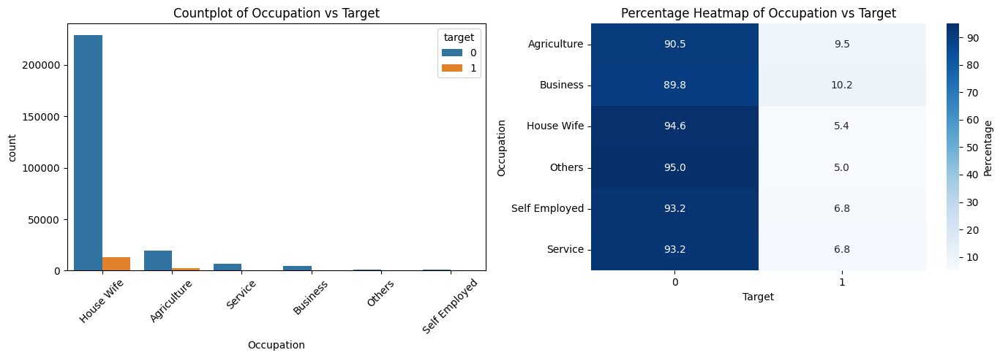

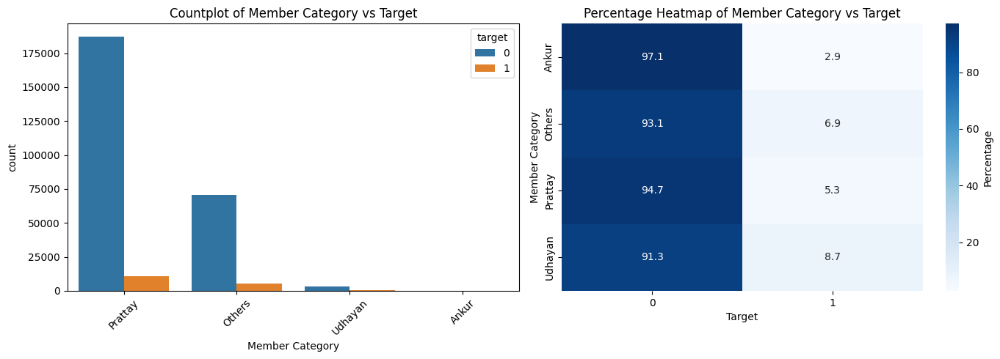

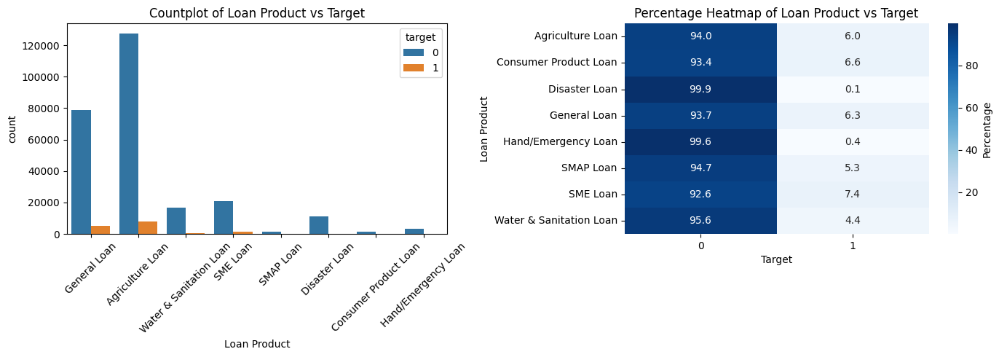

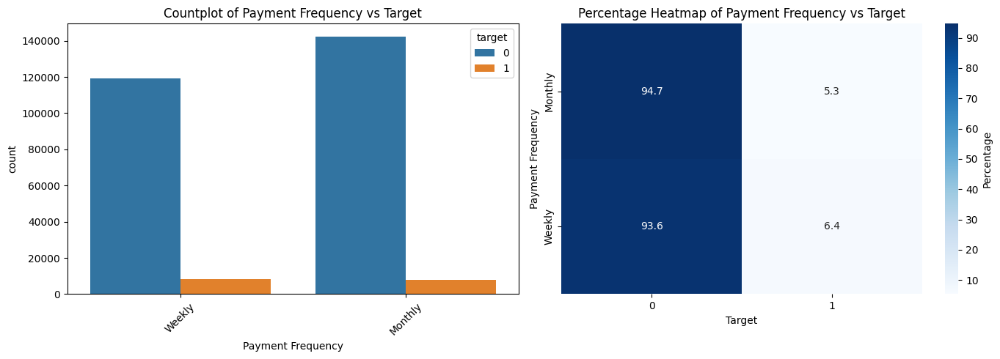

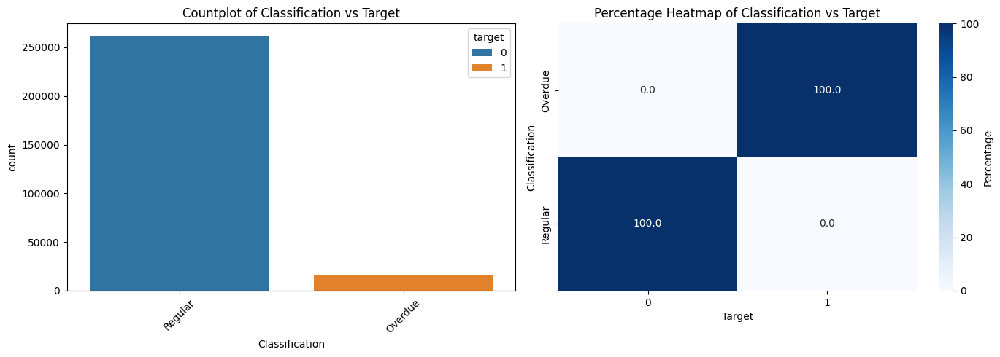

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

categorical_cols = df.select_dtypes(include='object').columns

for col in categorical_cols:
    # Create count data
    count_data = pd.crosstab(df[col], df['target'])

    # Convert to percentage
    percentage_data = count_data.div(count_data.sum(axis=1), axis=0) * 100

    # Create side-by-side subplots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Countplot
    sns.countplot(data=df, x=col, hue='target', ax=axes[0])
    axes[0].set_title(f"Countplot of {col} vs Target")
    axes[0].tick_params(axis='x', rotation=45)

    # Percentage Heatmap
    sns.heatmap(percentage_data, annot=True, fmt=".1f", cmap="Blues", cbar_kws={'label': 'Percentage'}, ax=axes[1])
    axes[1].set_title(f"Percentage Heatmap of {col} vs Target")
    axes[1].set_ylabel(col)
    axes[1].set_xlabel("Target")

    plt.tight_layout()
    plt.show()


In [41]:
print(df.columns.tolist())

['Education Level', 'Gender', 'FamilyMember', 'MaritalStatus', 'Home Type', 'Samity Type', 'Occupation', 'TotalWealth', 'Member Category', 'Disbursement Amount', 'Loan Product', 'Loan Duration in Months', 'LoanTerm', 'Payment Frequency', 'Installment Amount', 'Total Interest', 'Classification', 'BirthYear', 'DisbursementYear', 'target']


In [42]:
df['MaritalStatus'].value_counts()

,count
MaritalStatus,
Married,274888
Unmarried,2589


In [43]:
'''
# encoding education level
edu_order = {
    'Pre-Primary': 0, 'Primary': 1, 'Secondary': 2,
    'Higher-Secondary': 3, 'Graduate': 4, 'PostGraduate': 5,
    'Others': np.nan  # or np.nan if you want to treat as missing
}
df['Education_Level_Encoded'] = df['Education Level'].map(edu_order)

median_val = df['Education_Level_Encoded'].median()
df['Education_Level_Encoded'].fillna(median_val, inplace=True)

# encoding home type
home_order = {
    'Muddy': 1, 'Tin Shade': 2, 'Semi Building': 3, 'Rented': 0, 'Building': 4
}
df['Home Type'] = df['Home Type'].map(home_order)
'''

df = pd.get_dummies(df, columns=['Gender', 'MaritalStatus', 'Samity Type', 'Occupation', 'Member Category', 'Loan Product','Education Level','Payment Frequency','Home Type'])

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 277477 entries, 0 to 299999
Data columns (total 50 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   FamilyMember                          277477 non-null  float64
 1   TotalWealth                           277477 non-null  float64
 2   Disbursement Amount                   277477 non-null  int64  
 3   Loan Duration in Months               277477 non-null  int64  
 4   LoanTerm                              277477 non-null  int64  
 5   Installment Amount                    277477 non-null  int64  
 6   Total Interest                        277477 non-null  float64
 7   Classification                        277477 non-null  object 
 8   BirthYear                             277477 non-null  int32  
 9   DisbursementYear                      277477 non-null  int32  
 10  target                                277477 non-null  int64  
 11  Gende

In [45]:
# df = df.drop(columns=['Education Level', 'Home Type', 'Samity Type','Payment Frequency'])
# df = df.drop(columns=['Home Type'],axis=1)
df = df.drop(columns=['Gender_Trigender','MaritalStatus_Unmarried','Education Level_Others','Samity Type_Individual','Payment Frequency_Weekly',"Home Type_Rented"],axis=1)

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 277477 entries, 0 to 299999
Data columns (total 44 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   FamilyMember                          277477 non-null  float64
 1   TotalWealth                           277477 non-null  float64
 2   Disbursement Amount                   277477 non-null  int64  
 3   Loan Duration in Months               277477 non-null  int64  
 4   LoanTerm                              277477 non-null  int64  
 5   Installment Amount                    277477 non-null  int64  
 6   Total Interest                        277477 non-null  float64
 7   Classification                        277477 non-null  object 
 8   BirthYear                             277477 non-null  int32  
 9   DisbursementYear                      277477 non-null  int32  
 10  target                                277477 non-null  int64  
 11  Gende

In [47]:
df[['FamilyMember', 'Disbursement Amount', 'Loan Duration in Months', 'LoanTerm']].describe()

,FamilyMember,Disbursement Amount,Loan Duration in Months,LoanTerm
count,277477.000000,277477.000000,277477.00000,277477.000000
mean,4.077733,89711.582719,13.76384,2.006606
std,1.686447,77321.752657,4.63421,1.728390
min,0.000000,1000.000000,1.00000,1.000000
25%,3.000000,50000.000000,12.00000,1.000000
50%,4.000000,70000.000000,12.00000,1.000000
75%,5.000000,100000.000000,12.00000,2.000000
max,20.000000,985000.000000,36.00000,18.000000


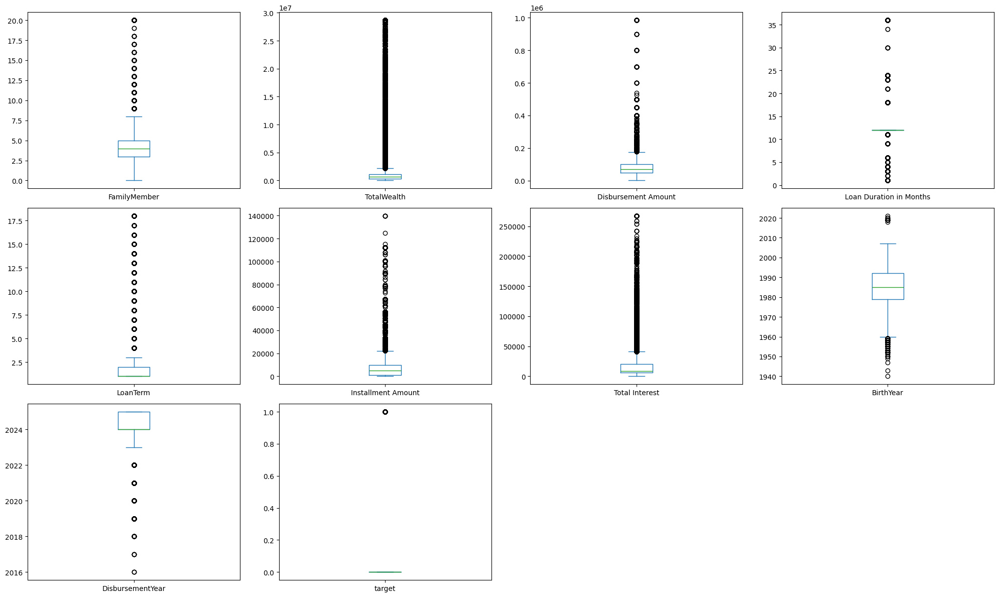

In [48]:
import matplotlib.pyplot as plt
import numpy as np

num_cols = df.select_dtypes(include='number').columns.tolist()
n_plots = len(num_cols)

# Compute number of rows and columns automatically
n_cols = 4
n_rows = int(np.ceil(n_plots / n_cols))

df[num_cols].plot(kind='box', subplots=True, layout=(n_rows, n_cols), figsize=(5*n_cols, 4*n_rows), sharex=False)

plt.tight_layout()
plt.show()

In [49]:
df.size

12208988

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 277477 entries, 0 to 299999
Data columns (total 44 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   FamilyMember                          277477 non-null  float64
 1   TotalWealth                           277477 non-null  float64
 2   Disbursement Amount                   277477 non-null  int64  
 3   Loan Duration in Months               277477 non-null  int64  
 4   LoanTerm                              277477 non-null  int64  
 5   Installment Amount                    277477 non-null  int64  
 6   Total Interest                        277477 non-null  float64
 7   Classification                        277477 non-null  object 
 8   BirthYear                             277477 non-null  int32  
 9   DisbursementYear                      277477 non-null  int32  
 10  target                                277477 non-null  int64  
 11  Gende

In [51]:
print(df['target'].dtype)

int64


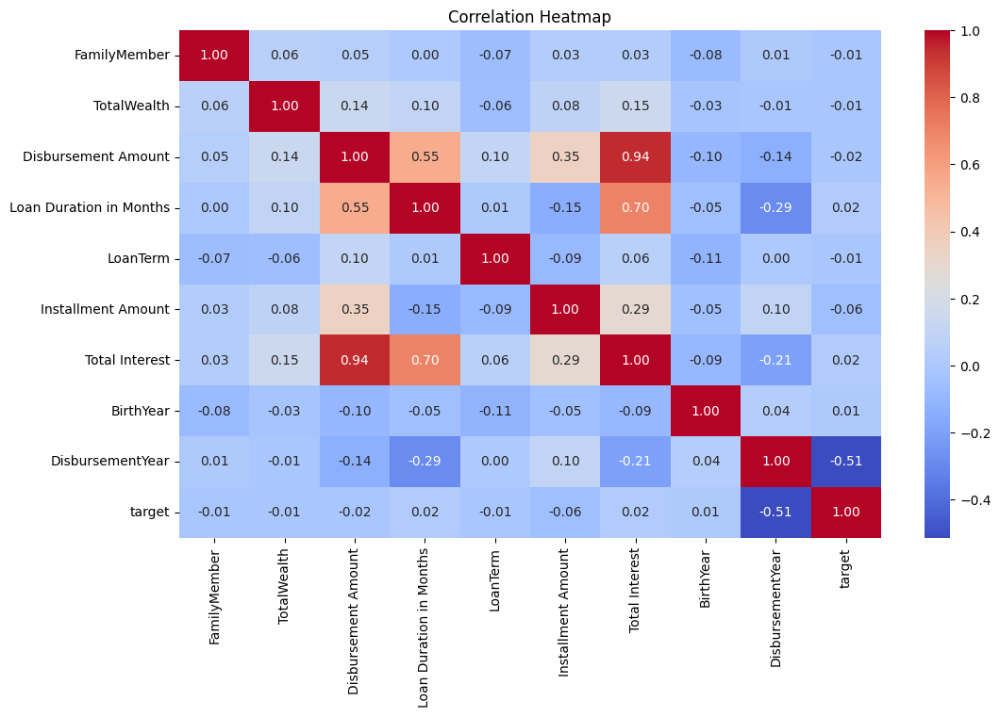

In [52]:
plt.figure(figsize=(12, 7))
sns.heatmap(df[numerical_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [53]:
df = df.drop(['Classification'], axis=1)

In [54]:
print(df['target'].dtype)
print(df['target'].unique())

int64
[0 1]


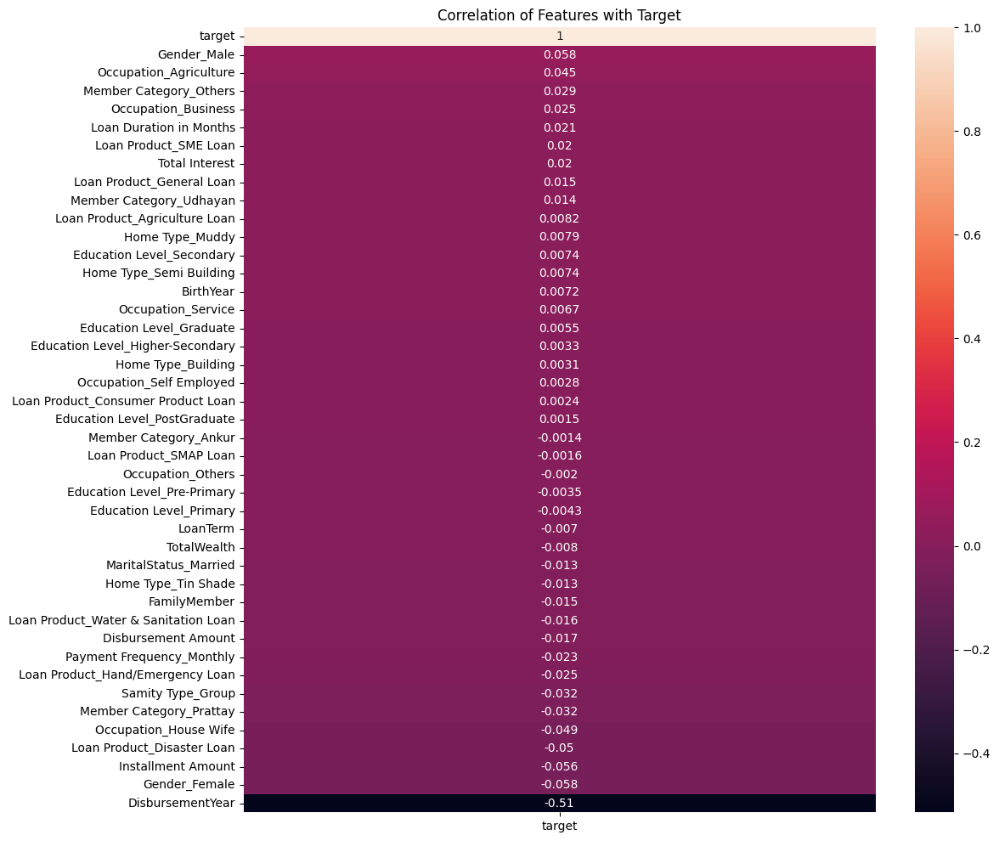

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

cor_matrix = df.corr()
plt.figure(figsize=(12,12))
sns.heatmap(cor_matrix[['target']].sort_values(by='target', ascending=False), annot=True)
plt.title("Correlation of Features with Target")
plt.show()


In [56]:
# Example: Selecting only personal features
# List of leakage-prone columns to drop

leakage_cols = [
    'LoanAge',   # optional
    'DisbursementYear'   # optional, drop only if you want to exclude financial data too
]

# Drop the leakage-prone columns
df_filtered = df.drop(columns=leakage_cols, errors='ignore')

# Check the updated columns
print("Remaining columns:", df_filtered.columns.tolist())

Remaining columns: ['FamilyMember', 'TotalWealth', 'Disbursement Amount', 'Loan Duration in Months', 'LoanTerm', 'Installment Amount', 'Total Interest', 'BirthYear', 'target', 'Gender_Female', 'Gender_Male', 'MaritalStatus_Married', 'Samity Type_Group', 'Occupation_Agriculture', 'Occupation_Business', 'Occupation_House Wife', 'Occupation_Others', 'Occupation_Self Employed', 'Occupation_Service', 'Member Category_Ankur', 'Member Category_Others', 'Member Category_Prattay', 'Member Category_Udhayan', 'Loan Product_Agriculture Loan', 'Loan Product_Consumer Product Loan', 'Loan Product_Disaster Loan', 'Loan Product_General Loan', 'Loan Product_Hand/Emergency Loan', 'Loan Product_SMAP Loan', 'Loan Product_SME Loan', 'Loan Product_Water & Sanitation Loan', 'Education Level_Graduate', 'Education Level_Higher-Secondary', 'Education Level_PostGraduate', 'Education Level_Pre-Primary', 'Education Level_Primary', 'Education Level_Secondary', 'Payment Frequency_Monthly', 'Home Type_Building', 'Home

In [57]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 277477 entries, 0 to 299999
Data columns (total 42 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   FamilyMember                          277477 non-null  float64
 1   TotalWealth                           277477 non-null  float64
 2   Disbursement Amount                   277477 non-null  int64  
 3   Loan Duration in Months               277477 non-null  int64  
 4   LoanTerm                              277477 non-null  int64  
 5   Installment Amount                    277477 non-null  int64  
 6   Total Interest                        277477 non-null  float64
 7   BirthYear                             277477 non-null  int32  
 8   target                                277477 non-null  int64  
 9   Gender_Female                         277477 non-null  bool   
 10  Gender_Male                           277477 non-null  bool   
 11  Marit

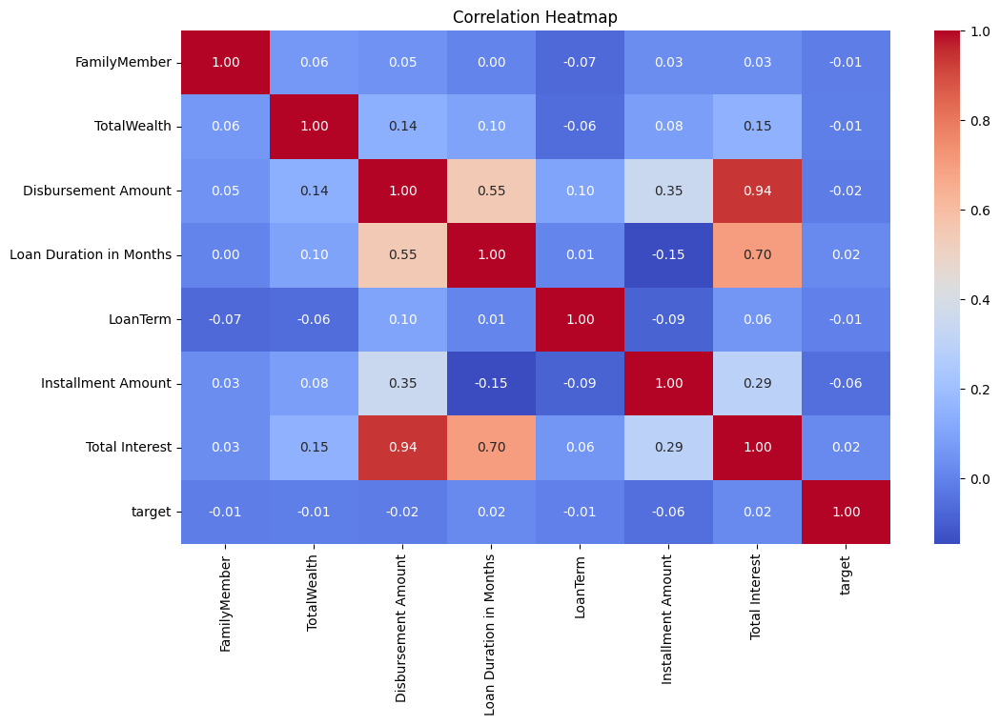

In [58]:
# Re-identify numerical columns after dropping
numerical_cols = df_filtered.select_dtypes(include=['int64', 'float64']).columns.tolist()

plt.figure(figsize=(12, 7))
sns.heatmap(df_filtered[numerical_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

# Train test split

In [59]:
# Split
X = df_filtered.drop(columns=['target'])
y = df_filtered['target']

# Step 1: Split into train and temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Step 2: Split temp into validation and test
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

In [60]:
# Scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_val = scaler.transform(X_val)

# Model Training

In [61]:
from sklearn.metrics import (
    recall_score,
    classification_report,
    f1_score,
    roc_auc_score,
    roc_curve, confusion_matrix
)
import seaborn as sns

In [62]:
# for logistic regression
# List of monetary numeric columns to log-transform
money_columns = ['Disbursement Amount', 'TotalWealth',
    'Installment Amount', 'Total Interest']
X_lr = X.copy()


# Then apply log1p (i.e., log(1 + x)) to preserve zeroes safely
for col in money_columns:
    # Apply log1p transform (safe for zero and positive)
    X_lr[col] = np.log1p(X_lr[col])

# Step 1: Split into train and temp
X_lr, X_temp_lr, y_train, y_temp = train_test_split(X_lr, y, test_size=0.3, stratify=y, random_state=42)

# Step 2: Split temp into validation and test
X_val_lr, X_lr_test, y_val, y_test = train_test_split(X_temp_lr, y_temp, test_size=0.5, stratify=y_temp, random_state=42)


X_lr = scaler.fit_transform(X_lr)
X_lr_test = scaler.transform(X_lr_test)

Recall Score: 0.6375257731958763
F1 Score: 0.205899980022641
AUC Score: 0.768843781175132
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.72      0.83     39197
           1       0.12      0.64      0.21      2425

    accuracy                           0.71     41622
   macro avg       0.55      0.68      0.52     41622
weighted avg       0.92      0.71      0.79     41622



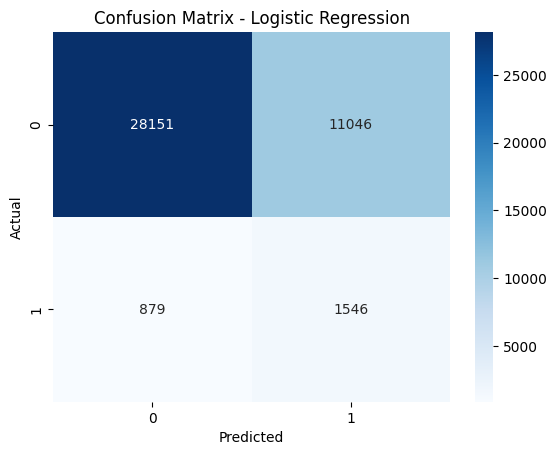

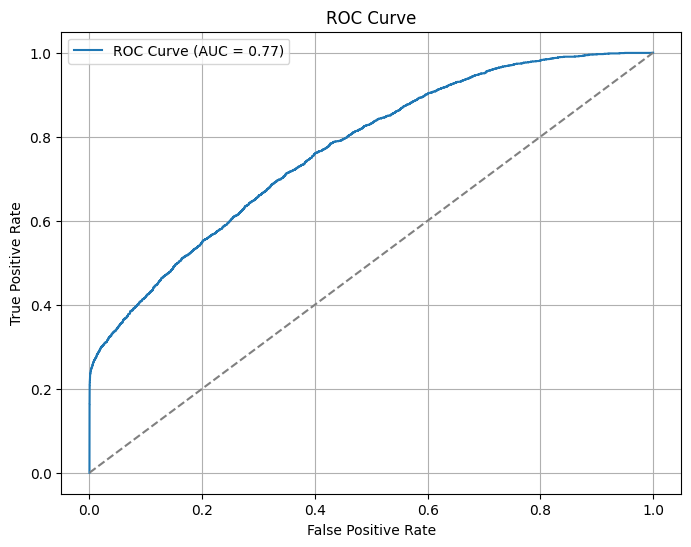

In [63]:
from sklearn.linear_model import LogisticRegression
# Initialize the model
lr=LogisticRegression(solver='liblinear', class_weight='balanced', max_iter=1000)
# Fit the model
lr.fit(X_lr, y_train)

# Predict
y_pred = lr.predict(X_lr_test)
y_proba = lr.predict_proba(X_lr_test)[:, 1]


# Evaluation metrics
print("Recall Score:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("AUC Score:", roc_auc_score(y_test, y_proba))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix Plot
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_score(y_test, y_proba):.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()


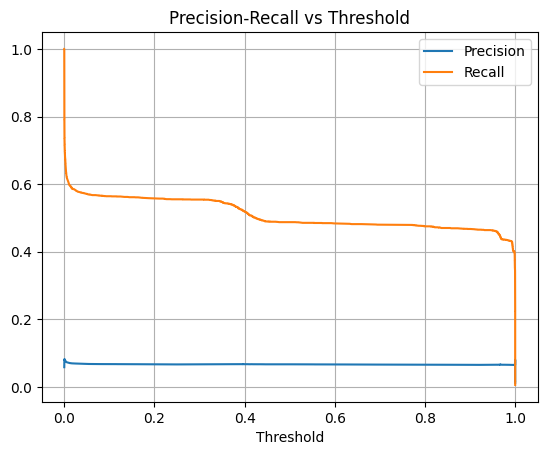

In [64]:
from sklearn.metrics import precision_recall_curve

# get model probabilities
y_proba = lr.predict_proba(X_test)[:, 1]
prec, rec, thresholds = precision_recall_curve(y_test, y_proba)

# plot precision-recall curve
import matplotlib.pyplot as plt
plt.plot(thresholds, prec[:-1], label='Precision')
plt.plot(thresholds, rec[:-1], label='Recall')
plt.xlabel("Threshold")
plt.legend()
plt.title("Precision-Recall vs Threshold")
plt.grid()
plt.show()


Recall Score: 0.28989690721649486
F1 Score: 0.12525612472160355
AUC Score: 0.6016553812633988
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.79      0.86     39197
           1       0.08      0.29      0.13      2425

    accuracy                           0.76     41622
   macro avg       0.51      0.54      0.49     41622
weighted avg       0.90      0.76      0.82     41622



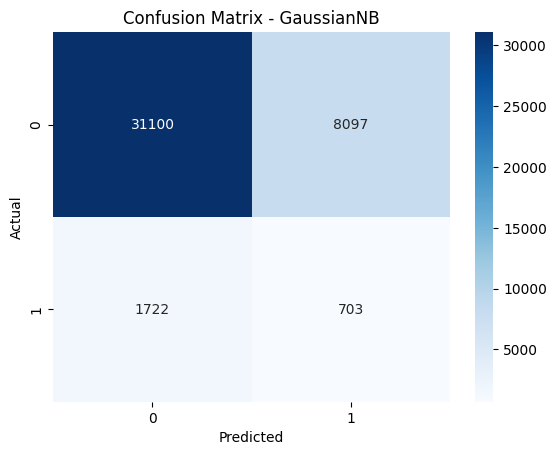

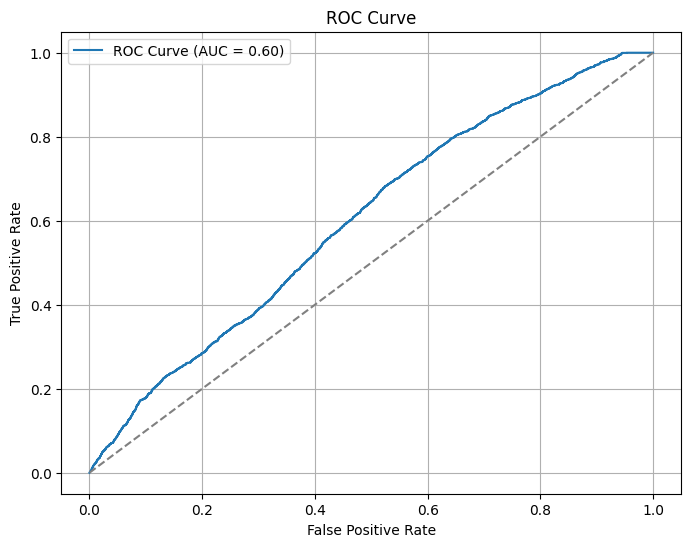

In [65]:
from sklearn.naive_bayes import GaussianNB
# Initialize the model
gnb = GaussianNB()

# Fit the model
gnb.fit(X_train, y_train)

# Predict
y_pred = gnb.predict(X_test)
y_proba = gnb.predict_proba(X_test)[:, 1]


# Evaluation metrics
print("Recall Score:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("AUC Score:", roc_auc_score(y_test, y_proba))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix Plot
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - GaussianNB")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_score(y_test, y_proba):.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

Recall Score: 0.1661855670103093
F1 Score: 0.2645224811289793
AUC Score: 0.7330682734240391
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     39197
           1       0.65      0.17      0.26      2425

    accuracy                           0.95     41622
   macro avg       0.80      0.58      0.62     41622
weighted avg       0.93      0.95      0.93     41622



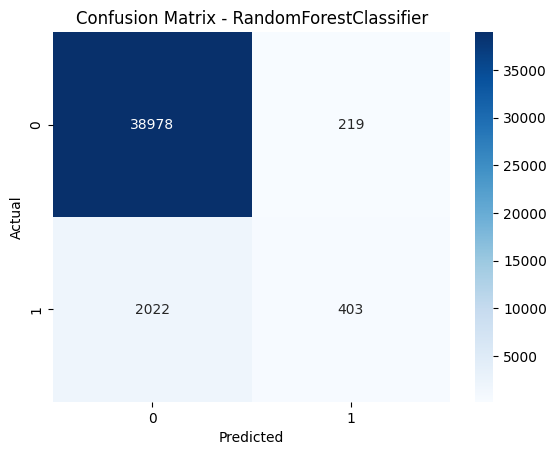

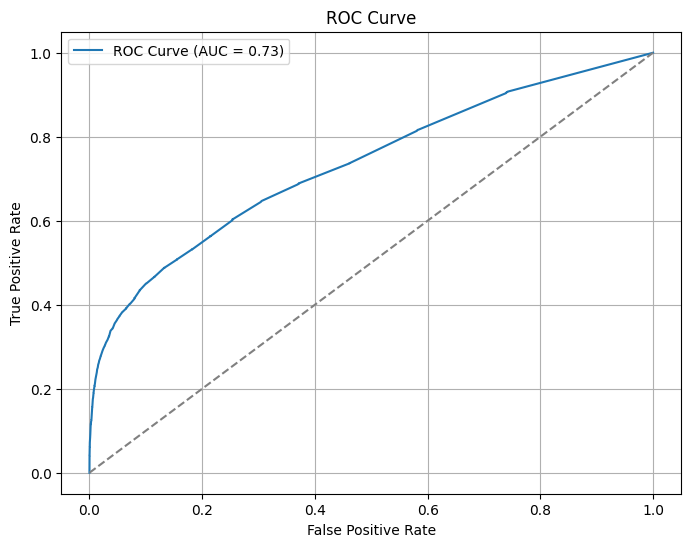

In [66]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(class_weight='balanced', random_state=42)
rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)
y_proba = rfc.predict_proba(X_test)[:, 1]

# Evaluation metrics
print("Recall Score:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("AUC Score:", roc_auc_score(y_test, y_proba))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix Plot
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - RandomForestClassifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_score(y_test, y_proba):.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [04:47:18] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Recall Score: 0.25608247422680414
F1 Score: 0.3927893738140417
AUC Score: 0.7882256084715089
Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98     39197
           1       0.84      0.26      0.39      2425

    accuracy                           0.95     41622
   macro avg       0.90      0.63      0.68     41622
weighted avg       0.95      0.95      0.94     41622



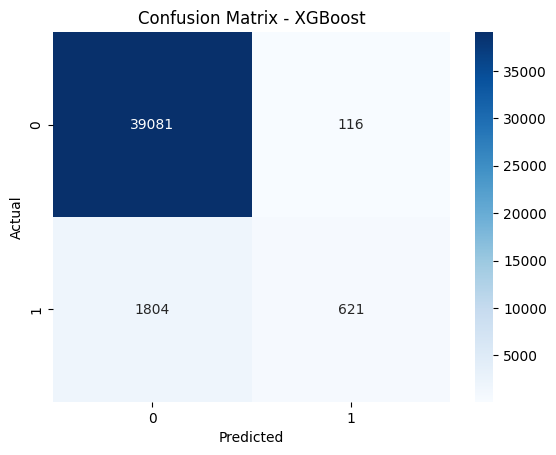

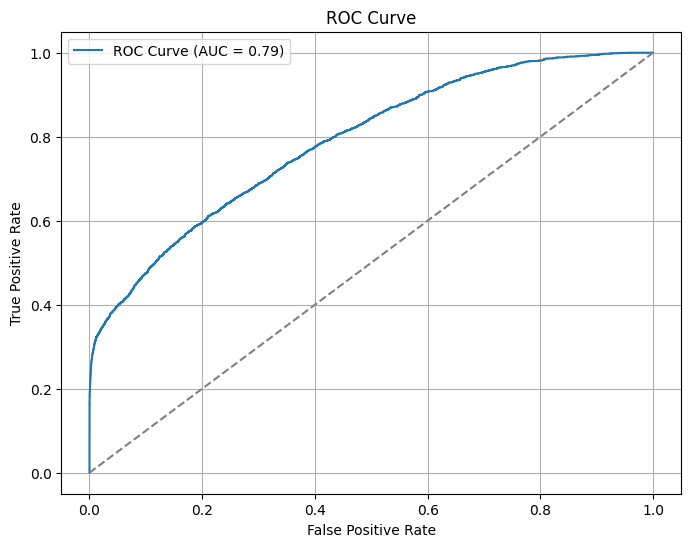

In [67]:
from xgboost import XGBClassifier

# Define the XGBoost classifier
xgb_model = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    random_state=42,
    subsample=1.0,
    colsample_bytree=0.6,
    learning_rate=0.1,
    max_depth=15,
    n_estimators=500,
    min_child_weight=8,
    scale_pos_weight=1,  # Because you're using SMOTE, no need to weight classes
    tree_method='hist',  # Faster training; change to 'auto' if unsure
    booster='gbtree'
)

# Fit the model on training data with validation set for early stopping
xgb_model.fit(
    X_train,
    y_train,
    eval_set=[(X_val, y_val)],
    verbose=False
)

# Predict and evaluate on the test set
y_pred = xgb_model.predict(X_test)
y_proba = xgb_model.predict_proba(X_test)[:, 1]

# Evaluation metrics
print("Recall Score:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("AUC Score:", roc_auc_score(y_test, y_proba))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix Plot
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - XGBoost")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_score(y_test, y_proba):.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

[LightGBM] [Info] Number of positive: 11317, number of negative: 182916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1128
[LightGBM] [Info] Number of data points in the train set: 194233, number of used features: 41
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058265 -> initscore=-2.782721
[LightGBM] [Info] Start training from score -2.782721


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Recall Score: 0.2705154639175258
F1 Score: 0.41218975808985236
AUC Score: 0.8087153103711652
Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98     39197
           1       0.87      0.27      0.41      2425

    accuracy                           0.96     41622
   macro avg       0.91      0.63      0.69     41622
weighted avg       0.95      0.96      0.94     41622



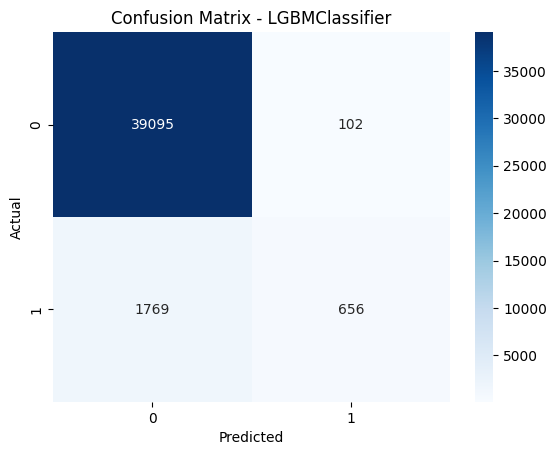

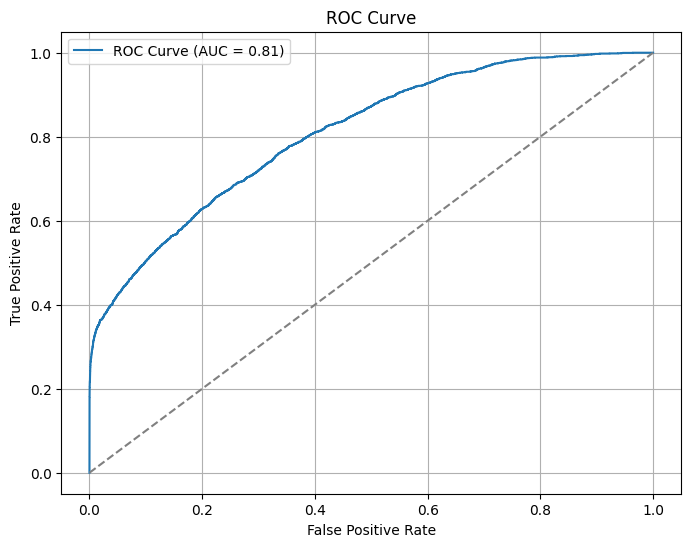

In [68]:
from lightgbm import LGBMClassifier
# Define the LightGBM classifier
lgbm = LGBMClassifier(
    objective='binary',
    metric='binary_logloss',
    random_state=42,
    subsample=0.9,
    colsample_bytree=0.6,
    learning_rate=0.1,
    max_depth=15,
    n_estimators=500,
    min_child_samples=8,
    num_leaves=63,
    boosting_type='gbdt',
    class_weight=None  # Set to None because SMOTE was used
)

# Fit the model
lgbm.fit(
    X_train,
    y_train,
    eval_set=[(X_val, y_val)],
)

# Predict labels and probabilities
y_pred = lgbm.predict(X_test)
y_proba = lgbm.predict_proba(X_test)[:, 1]

# Evaluation metrics
print("Recall Score:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("AUC Score:", roc_auc_score(y_test, y_proba))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix Plot
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - LGBMClassifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_score(y_test, y_proba):.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

In [84]:
import joblib

# Save trained model to a file
joblib.dump(lgbm, 'model.pkl')


['model.pkl']

In [85]:
from google.colab import files

# Download the model to your local machine
files.download('model.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Model comparison**

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


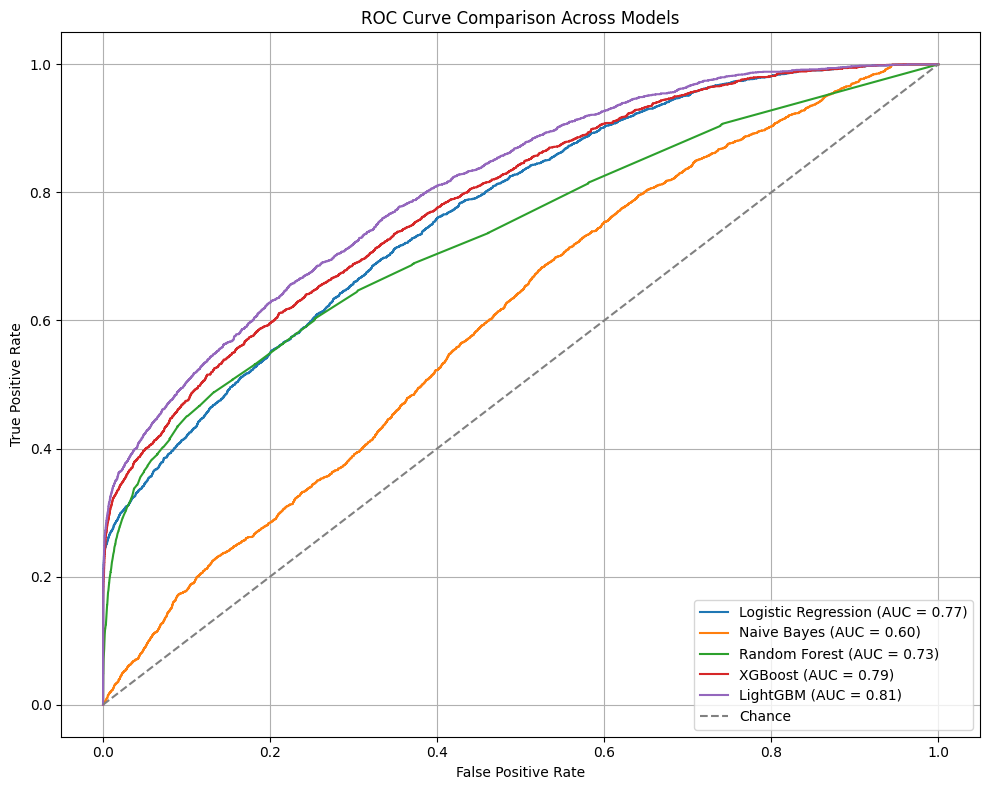

In [71]:
# Dictionary to store model names and their predicted probabilities
models_probas = {
    "Logistic Regression": lr.predict_proba(X_lr_test)[:, 1],
    "Naive Bayes": gnb.predict_proba(X_test)[:, 1],
    "Random Forest": rfc.predict_proba(X_test)[:, 1],
    "XGBoost": xgb_model.predict_proba(X_test)[:, 1],
    "LightGBM": lgbm.predict_proba(X_test)[:, 1]
}

plt.figure(figsize=(10, 8))

# Plot each ROC curve
for model_name, y_proba in models_probas.items():
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc_score = roc_auc_score(y_test, y_proba)
    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {auc_score:.2f})")

# Plot baseline
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance')

# Plot settings
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison Across Models")
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# Interpretation

In [72]:
pip install shap lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1e4f81061bebc91165cf384446bedbfc25731b38c4b696835efae7753c122018
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


**LIME**

In [73]:
import lime
import lime.lime_tabular
import numpy as np

# LIME EXPLANATION

X_test_df = pd.DataFrame(X_test, columns=X.columns)

# Create LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_test_df.columns.tolist(),
    class_names=['Non-Default', 'Default'],
    mode='classification'
)

In [74]:
# Explain a specific instance


idx= 1993
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_df.iloc[idx],
    predict_fn=lgbm.predict_proba,
    num_features=10
)

# Show in notebook or save to HTML
lime_exp.show_in_notebook(show_table=True, show_all=False)
# To save as HTML: lime_exp.save_to_file('lime_explanation.html')

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

**Inference**

In [75]:
# Assuming X_test_df and lgbm are already defined
idx = 5
print("Raw Data: ", X_test_df.iloc[idx])

lime_exp = lime_explainer.explain_instance(
    data_row=X_test_df.iloc[idx],
    predict_fn=lgbm.predict_proba,
    num_features=10
)

# This gives the interactive visualization like your screenshot
lime_exp.show_in_notebook(show_table=True, show_all=False)

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Raw Data:  FamilyMember                           -0.044917
TotalWealth                            -0.054165
Disbursement Amount                    -0.993111
Loan Duration in Months                -0.382356
LoanTerm                               -0.004097
Installment Amount                     -0.637260
Total Interest                         -0.727076
BirthYear                              -0.112734
Gender_Female                           0.332949
Gender_Male                            -0.332834
MaritalStatus_Married                   0.097580
Samity Type_Group                       0.635902
Occupation_Agriculture                 -0.291439
Occupation_Business                    -0.133259
Occupation_House Wife                   0.384050
Occupation_Others                      -0.057677
Occupation_Self Employed               -0.067732
Occupation_Service                     -0.159860
Member Category_Ankur                  -0.010643
Member Category_Others                 -0.614013
Member Ca

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem

In [76]:
# Explain a specific instance


idx= 64
print("Raw Data: ", X_test_df.loc[idx])
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_df.loc[idx],
    predict_fn=lgbm.predict_proba,
    num_features=10
)

# Show in notebook or save to HTML
lime_exp.show_in_notebook(show_table=True, show_all=False)

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Raw Data:  FamilyMember                           -0.044917
TotalWealth                            -0.405246
Disbursement Amount                     0.134502
Loan Duration in Months                -0.382356
LoanTerm                                2.309156
Installment Amount                     -0.442861
Total Interest                         -0.166131
BirthYear                              -0.003764
Gender_Female                           0.332949
Gender_Male                            -0.332834
MaritalStatus_Married                   0.097580
Samity Type_Group                       0.635902
Occupation_Agriculture                 -0.291439
Occupation_Business                    -0.133259
Occupation_House Wife                   0.384050
Occupation_Others                      -0.057677
Occupation_Self Employed               -0.067732
Occupation_Service                     -0.159860
Member Category_Ankur                  -0.010643
Member Category_Others                 -0.614013
Member Ca

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem

In [77]:
import warnings
warnings.filterwarnings('ignore')

In [78]:
import lime
import lime.lime_tabular
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt

X_train_df = pd.DataFrame(X_train, columns=X.columns)
# Step 1: Initialize the LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train_df.columns.tolist(),
    class_names=['Non-Default', 'Default'],
    mode='classification'
)

# Step 2: Aggregate feature importances over multiple samples
def compute_global_lime_importance(model, X_sample, num_features=10):
    feature_weights = defaultdict(list)

    for i in range(len(X_sample)):
        exp = lime_explainer.explain_instance(
            data_row=X_sample.iloc[i],
            predict_fn=model.predict_proba,
            num_features=num_features
        )
        for feature, weight in exp.as_list():
            feature_name = feature.split(' <= ')[0].split(' > ')[0]  # clean feature name
            feature_weights[feature_name].append(abs(weight))

    # Average absolute weight per feature
    avg_importance = {feat: np.mean(weights) for feat, weights in feature_weights.items()}
    sorted_importance = dict(sorted(avg_importance.items(), key=lambda item: item[1], reverse=True))
    return sorted_importance

# Sample 100 instances from test set
sampled_X = X_test_df.sample(n=100, random_state=42)

# Step 3: Compute and plot
global_lime_importance = compute_global_lime_importance(lgbm, sampled_X)


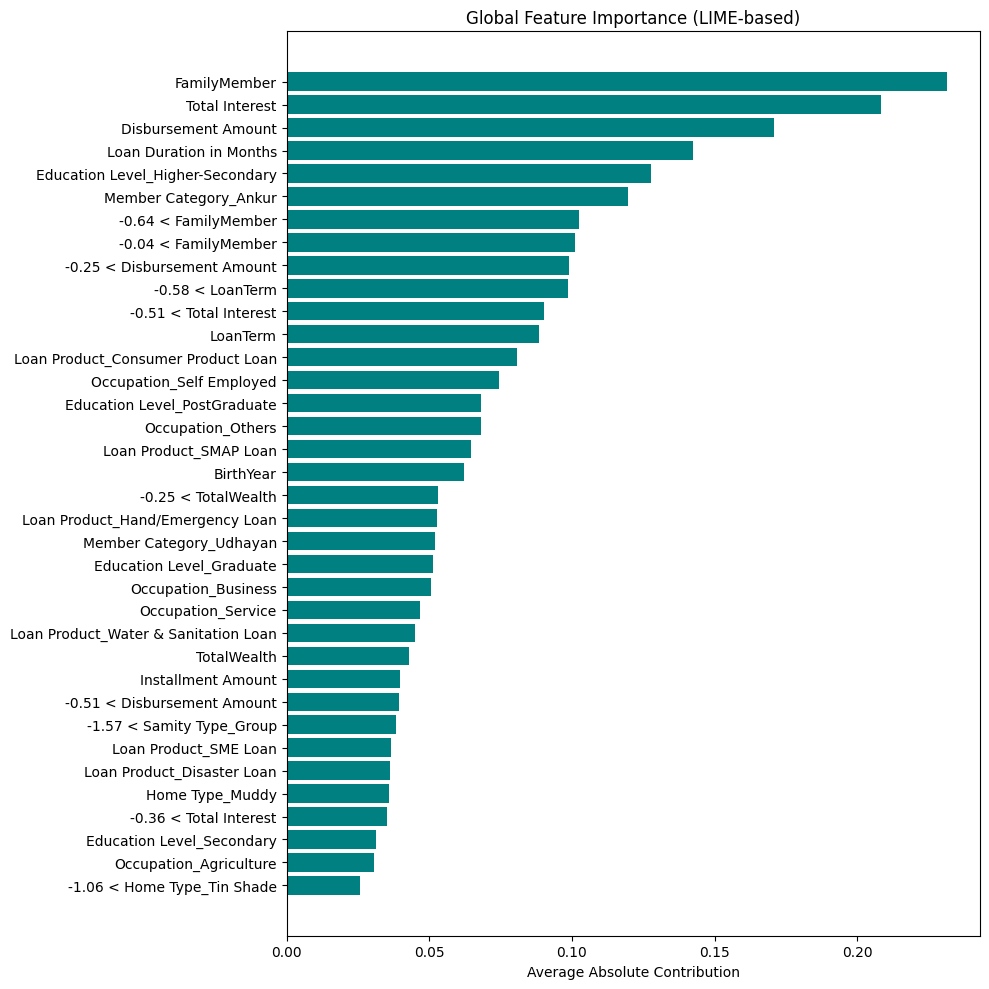

In [79]:
# Plot
plt.figure(figsize=(10, 10))
plt.barh(list(global_lime_importance.keys()), list(global_lime_importance.values()), color='teal')
plt.xlabel("Average Absolute Contribution")
plt.title("Global Feature Importance (LIME-based)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

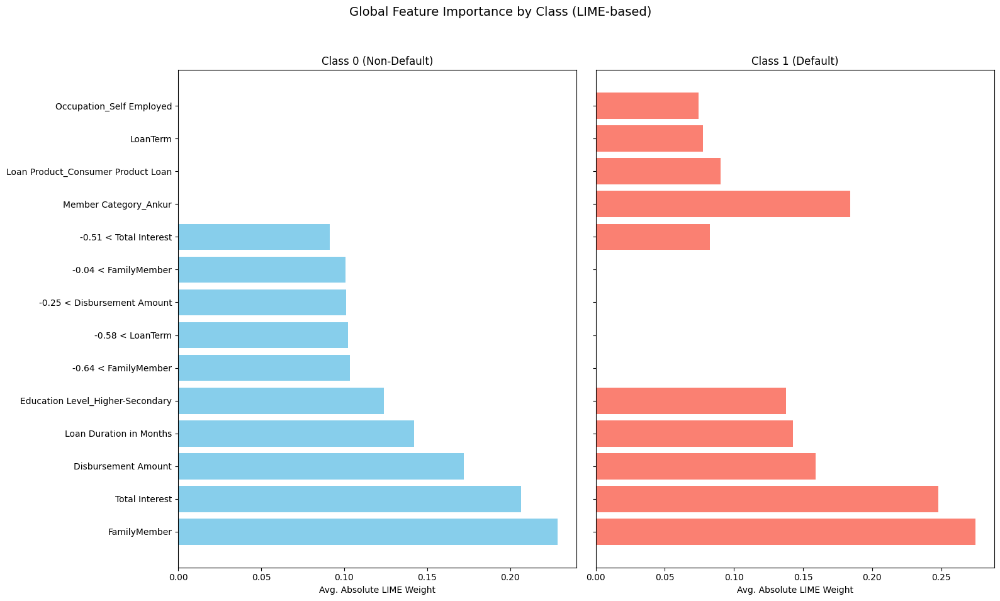

In [80]:
import lime
import lime.lime_tabular
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt

# Initialize LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train_df.columns.tolist(),
    class_names=['Non-Default', 'Default'],
    mode='classification'
)

# Function to compute class-wise feature importances
def compute_classwise_lime_importance(model, X_sample, num_features=10):
    class_feature_weights = {0: defaultdict(list), 1: defaultdict(list)}

    for i in range(len(X_sample)):
        row = X_sample.iloc[i]
        pred_class = model.predict([row])[0]  # 0 or 1

        exp = lime_explainer.explain_instance(
            data_row=row,
            predict_fn=model.predict_proba,
            num_features=num_features
        )

        for feature, weight in exp.as_list():
            feature_name = feature.split(' <= ')[0].split(' > ')[0]  # clean feature name
            class_feature_weights[pred_class][feature_name].append(abs(weight))

    # Average absolute weights per feature for each class
    class_avg_importance = {
        c: {f: np.mean(w) for f, w in class_feature_weights[c].items()}
        for c in [0, 1]
    }

    # Sort them
    class_avg_importance[0] = dict(sorted(class_avg_importance[0].items(), key=lambda x: x[1], reverse=True))
    class_avg_importance[1] = dict(sorted(class_avg_importance[1].items(), key=lambda x: x[1], reverse=True))

    return class_avg_importance

# Sample 100 rows
sampled_X = X_test_df.sample(n=100, random_state=42)

# Compute per-class importance
classwise_importance = compute_classwise_lime_importance(lgbm, sampled_X)

# Plot side-by-side bar charts
def plot_classwise_lime_importance(classwise_importance):
    fig, axes = plt.subplots(1, 2, figsize=(16, 10), sharey=True)

    for i, cls in enumerate([0, 1]):
        ax = axes[i]
        feats = list(classwise_importance[cls].keys())[:10]
        vals = list(classwise_importance[cls].values())[:10]
        ax.barh(feats, vals, color='skyblue' if cls == 0 else 'salmon')
        ax.set_title(f"Class {cls} ({'Non-Default' if cls == 0 else 'Default'})")
        ax.set_xlabel("Avg. Absolute LIME Weight")
        ax.invert_yaxis()

    plt.suptitle("Global Feature Importance by Class (LIME-based)", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Show the plot
plot_classwise_lime_importance(classwise_importance)

**SHAP**

In [81]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# SHAP Setup (Only Once)

shap.initjs()

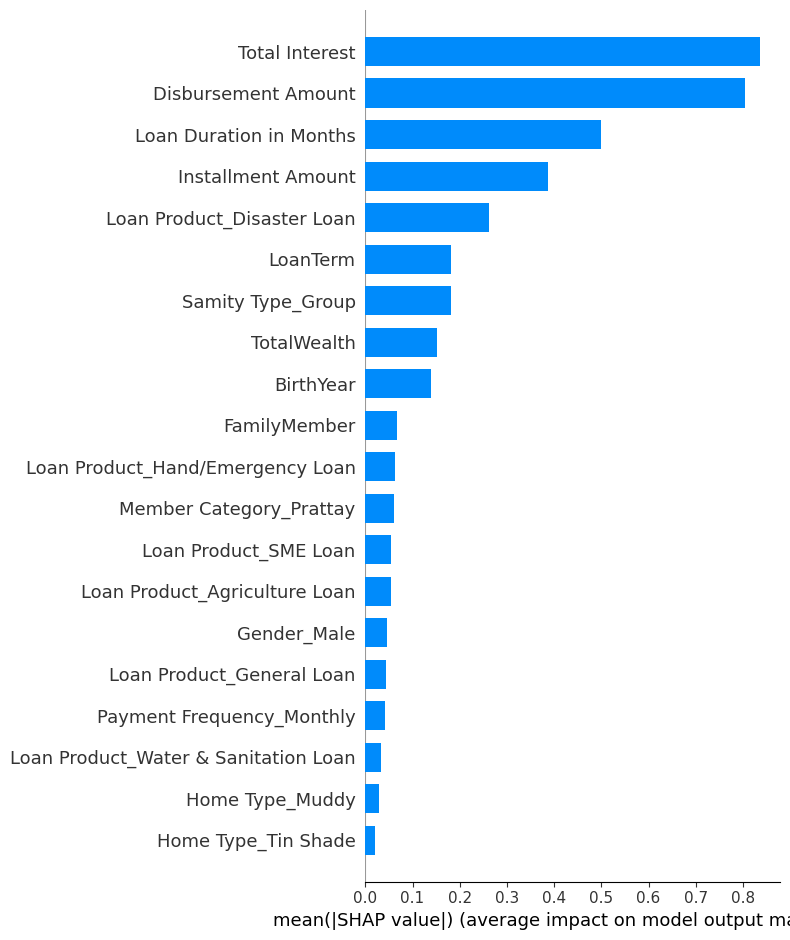

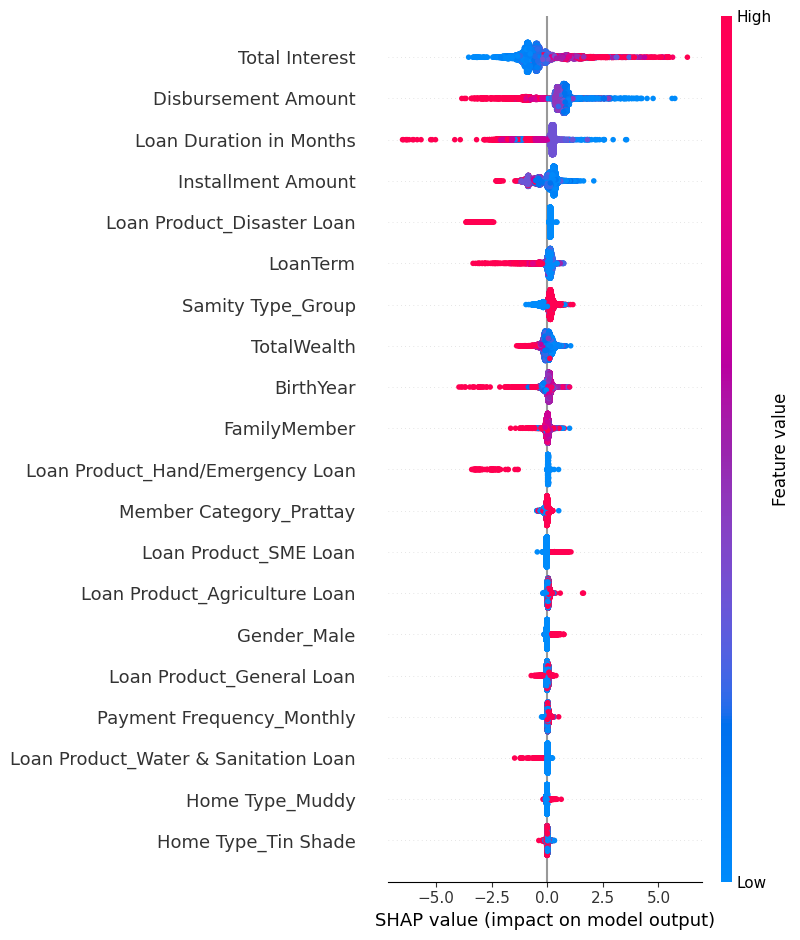

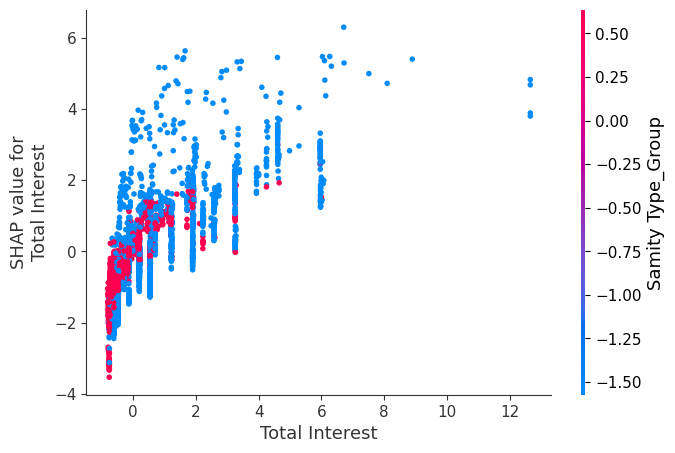

In [82]:
# Compute SHAP values efficiently (use a sample)
sample_size = 10000  # increase this if time allows
sample_size = min(sample_size, len(X_test_df))
x_sample = X_test_df.sample(n=sample_size, random_state=42)

# TreeExplainer is efficient for tree-based models like LightGBM
explainer = shap.Explainer(lgbm)
shap_values = explainer(x_sample)

# 1. Global Feature Importance
shap.summary_plot(shap_values, x_sample, plot_type="bar", show=True)

#2. SHAP Summary Plot
shap.summary_plot(shap_values, x_sample, show=True)

#  3. SHAP Dependence Plot
# Automatically pick top feature
top_feature = x_sample.columns[np.argsort(np.abs(shap_values.values).mean(0))[::-1][0]]
shap.dependence_plot(top_feature, shap_values.values, x_sample)

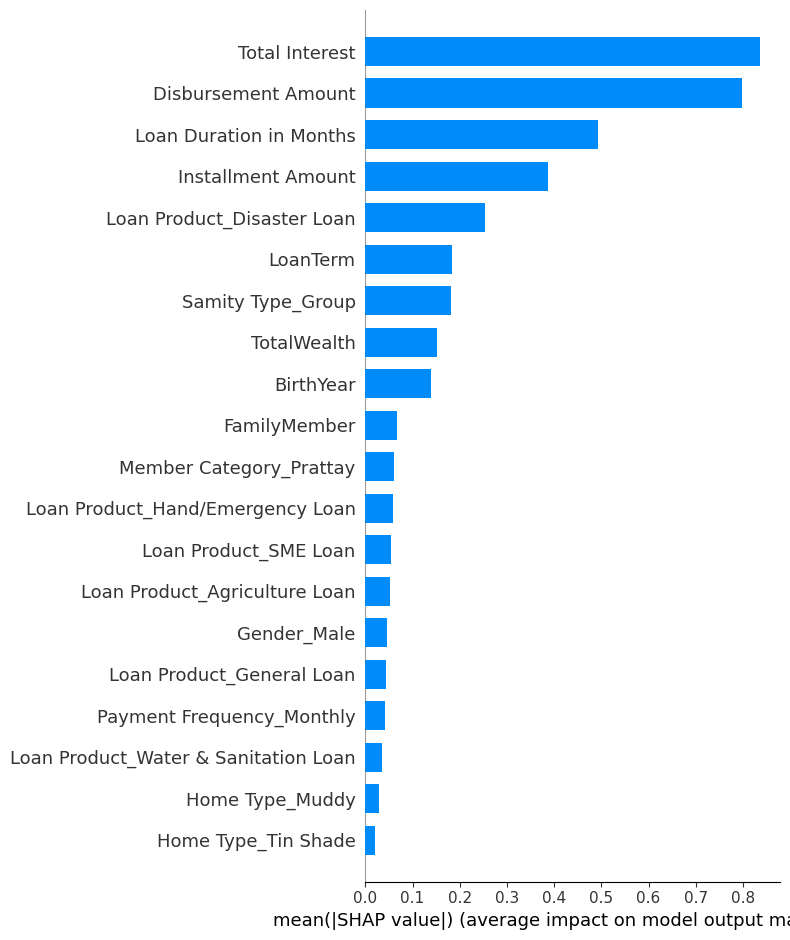

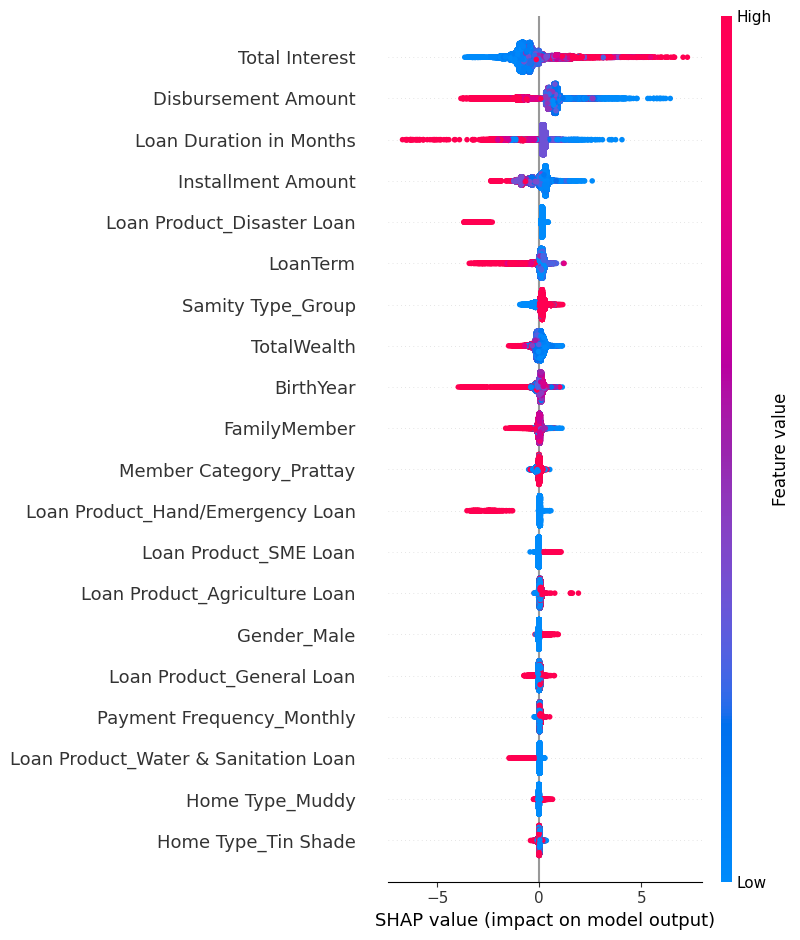

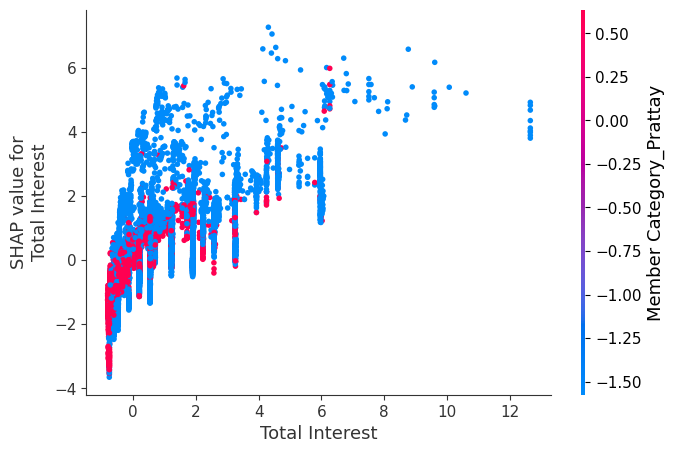

In [83]:
import shap
import numpy as np
##SHAP on whole test data

# Use TreeExplainer with LightGBM
explainer = shap.Explainer(lgbm)  # use training data as background

# Compute SHAP values for the full test set
shap_values = explainer(X_test_df)

# 1. Global Feature Importance (Bar Plot)
shap.summary_plot(shap_values, X_test_df, plot_type="bar", show=True)

# 2. SHAP Summary Plot (Beeswarm)
shap.summary_plot(shap_values, X_test_df, show=True)

# 3. SHAP Dependence Plot for the top feature
top_feature = X_test_df.columns[np.argsort(np.abs(shap_values.values).mean(0))[::-1][0]]
shap.dependence_plot(top_feature, shap_values.values, X_test_df)
